In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
from matplotlib import rc
rc('axes', fc='w')
rc('figure', fc='w')
rc('savefig', fc='w')
rc('axes', axisbelow=True)

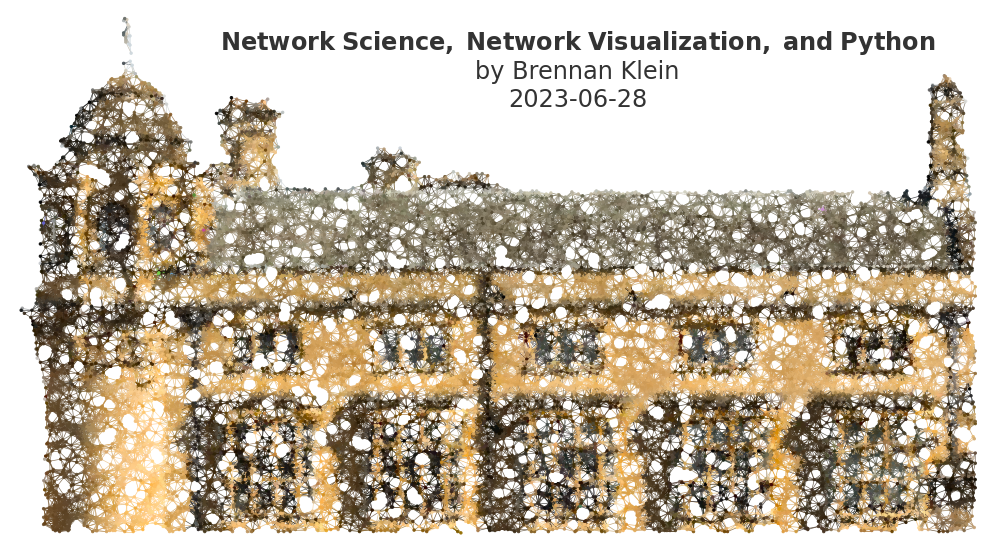

In [2]:
from netart_oxford import *
create_art()

# Network Science, Network Visualization, and Python
by __[Brennan Klein](https://github.com/jkbren)__ (June 28, 2023)

## Standard Python packages used in this tutorial
* numpy
* scipy
* pandas
* matplotlib
* networkx

## Other Python packages used here
* [geopandas](https://geopandas.org/en/stable/)
* [infomap](https://mapequation.github.io/infomap/)
* [community](https://github.com/taynaud/python-louvain)

### Other useful network science / network analysis packages
* [graph-tool](https://graph-tool.skewed.de/)
    * Much more popular recently due to its sophisticated and principled techniques for modeling networks as statistical objects.
* __[netrd](https://github.com/netsiphd/netrd)__
    * Useful for reconstructing networks from time series data, comparing networks, or simulating dynamics on networks.
* [igraph](https://igraph.org/https://igraph.org/)
    * Has many algorighms / functionality that is not native to `networkx`.

### Other useful Network Science packages 
* Also check out  if you're interested in 

_____________

# 1.0 Today, we will primarily work within `networkx`

In [3]:
import networkx as nx
nx.__version__

'3.1'

## 1.1 `networkx` objects
From the networkx documentation page: 

    "By definition, a Graph is a collection of nodes (vertices) along with identified pairs of nodes (called edges, links, etc). In NetworkX, nodes can be any hashable object e.g., a text string, an image, an XML object, another Graph, a customized node object, etc."

In [4]:
# Let's create two distinct empty graphs: 

graph = nx.Graph() # undirected graph
digraph = nx.DiGraph() # directed graph

## 1.2 Adding nodes

In [5]:
# First, we can populate the graphs with some nodes
# We can do this in several ways:

# 1) We can add one node at the time
for i in range(10):
    graph.add_node(i)

In [6]:
# 2) We can add nodes from a list or any other iterable container
nodes = ['a','b','c','d','e'] # notice that nodes can be strings
digraph.add_nodes_from(nodes)

In [7]:
list(digraph.nodes())

['a', 'b', 'c', 'd', 'e']

In [8]:
list(graph.nodes())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [9]:
# 3) We can also directly add edges and if the node is not present, it will be added
graph.add_edge(1,20)

In [10]:
graph.add_edge('brennan','enya')

In [11]:
# We can retrieve the list of nodes in each graph by accessing
print(graph.nodes())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 20, 'brennan', 'enya']


## 1.3 Adding Edges

In [12]:
# Now that we added a bunch of nodes, we can add some edges
# 1) We can add one edge at the time (as we have just witnessed above)
digraph.add_edge('a','b')
digraph.add_edge('c','a')

In [13]:
list(digraph.edges())

[('a', 'b'), ('c', 'a')]

In [14]:
# 2) We can add an entire edge list all at once
edge_list = [(1,2), (3,5), (9,4), (4,7)]
graph.add_edges_from(edge_list)

In [15]:
# We can retrieve the list of edges in each graph by simply running
print(digraph.edges())

[('a', 'b'), ('c', 'a')]


In [16]:
# However, when graphs are big (either in terms of the number of nodes or in terms of the number of edges),
# it is more convenient to loop over "iterators" and not over lists.
for edge in graph.edges():
    print(edge)

(1, 20)
(1, 2)
(3, 5)
(4, 9)
(4, 7)
('brennan', 'enya')


In [17]:
# We can also retrieve the list of neighbors of a given node
print(list(graph.neighbors(1)))
print(list(digraph.predecessors('a')))
print(list(digraph.successors('a')))

[20, 2]
['c']
['b']


## 1.4 Adding node and edge attributes
In NetworkX, we can add additional features to our graphs other than the simple presence of nodes and edges. <br>
In particular, we can add attributes to both entities. <br>


In [18]:
# For example, we might wanna add a "size" attribute to each node, 
# so we can use it once we decide to visualize a graph.
graph.add_node(50,size=100,weight=90)

In [19]:
list(graph.nodes())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 20, 'brennan', 'enya', 50]

In [20]:
print(graph.nodes(data=True)) # the "data=True" bit means you want to see node attributes

[(0, {}), (1, {}), (2, {}), (3, {}), (4, {}), (5, {}), (6, {}), (7, {}), (8, {}), (9, {}), (20, {}), ('brennan', {}), ('enya', {}), (50, {'size': 100, 'weight': 90})]


In [21]:
# or we might want to associate a "weight" to each edge we include in the graph
digraph.add_edge('a','b',weight=10, timestamp='monday')

In [22]:
print(digraph.edges(data=True))

[('a', 'b', {'weight': 10, 'timestamp': 'monday'}), ('c', 'a', {})]


In [23]:
# However, we might also want to add a new attribute to all nodes or edges already present in the graph.
# This can be done using the "set_node_attributes" or "set_edge_attributes" methods provided by NetworkX:

new_node_attribute_values = {node:75 for node in graph.nodes()}
nx.set_node_attributes(graph, new_node_attribute_values, 'size')
# graph= the data you want, new_node_attribute_values is the variable you're adding,
# 'size'= is the name of the attribute

In [24]:
print(graph.nodes(data=True))

[(0, {'size': 75}), (1, {'size': 75}), (2, {'size': 75}), (3, {'size': 75}), (4, {'size': 75}), (5, {'size': 75}), (6, {'size': 75}), (7, {'size': 75}), (8, {'size': 75}), (9, {'size': 75}), (20, {'size': 75}), ('brennan', {'size': 75}), ('enya', {'size': 75}), (50, {'size': 75, 'weight': 90})]


In [25]:
new_edge_attribute_values = {edge:'blue' for edge in graph.edges()}
nx.set_edge_attributes(graph, new_edge_attribute_values, 'color')

In [26]:
nx.get_edge_attributes(graph,'color')

{(1, 20): 'blue',
 (1, 2): 'blue',
 (3, 5): 'blue',
 (4, 9): 'blue',
 (4, 7): 'blue',
 ('brennan', 'enya'): 'blue'}

In [27]:
print(graph.edges(data=True))

[(1, 20, {'color': 'blue'}), (1, 2, {'color': 'blue'}), (3, 5, {'color': 'blue'}), (4, 9, {'color': 'blue'}), (4, 7, {'color': 'blue'}), ('brennan', 'enya', {'color': 'blue'})]


## 1.5 Removing Nodes and Edges

In [28]:
# We can remove all nodes and edges
digraph.clear()
print(digraph.nodes())

[]


In [29]:
# Or simply remove some of the nodes/edges..
#..one item at the time
graph.remove_edge(1,2)
graph.remove_node(7)

In [30]:
#..or several items all at once
edge_list = [(1,2), (9,4)]
graph.remove_edges_from(edge_list)

node_list = [3,5]
graph.remove_nodes_from(node_list)

## 1.6 Perform basic operations on the network
### 1.6.1 Get the number of nodes and links in the graph

In [31]:
edge_list = [(1,2), (3,5), (9,4), (4,7)]
graph.add_edges_from(edge_list)

print("Number of nodes: %d" % graph.number_of_nodes())
print("Number of edges: %d" % graph.number_of_edges())

Number of nodes: 14
Number of edges: 6


In [32]:
graph.name = 'My graph'
graph.name

'My graph'

________

# 1.7 Input / output of network data: The "Polblogs" dataset
**Source:** [Adamic, L. A., & Glance, N. (2005)](https://doi.org/10.1145/1134271.1134277https://doi.org/10.1145/1134271.1134277). The political blogosphere and the 2004 US election: Divided they blog. In *Proceedings of the 3rd International Workshop on Link Discovery* (pp. 36-43).

#### Step-by-step way to make this network:
1. One-by-one add nodes (blogs)
2. Connect nodes based on hyperlinks between blogs

In [33]:
digraph = nx.DiGraph()
with open('./datasets/polblogs_nodes_class.tsv','r') as fp:
    for line in fp:
        node_id, node_label, node_political = line.strip().split('\t')
        political_orientation = 'liberal' if node_political == '0' else 'conservative'
        digraph.add_node(node_id, website=node_label, political_orientation=political_orientation)

In [34]:
with open('./datasets/polblogs_edges_class.tsv','r') as fp:
    for line in fp:
        source_node_id, target_node_id = line.strip().split('\t')
        digraph.add_edge(source_node_id, target_node_id)

In [35]:
print("Number of nodes: %d" % digraph.number_of_nodes())
print("Number of edges: %d" % digraph.number_of_edges())
print("Graph density:\t %1.7f" % nx.density(digraph))

Number of nodes: 1490
Number of edges: 19025
Graph density:	 0.0085752


## 1.7.1 Calculate properties of our graph - degree

In [36]:
degree = digraph.degree()
in_degree = digraph.in_degree()
out_degree = digraph.out_degree()

# I ususally make this a dictionary straight away
degree = dict(degree)
in_degree = dict(in_degree)
out_degree = dict(out_degree)

for i,j in list(degree.items())[:7]:
    print('Node', i, 'is connected to', j, 'other nodes')
print('...')
print('...... and so on')

Node 0 is connected to 27 other nodes
Node 1 is connected to 48 other nodes
Node 2 is connected to 0 other nodes
Node 3 is connected to 0 other nodes
Node 4 is connected to 4 other nodes
Node 5 is connected to 1 other nodes
Node 6 is connected to 1 other nodes
...
...... and so on


In [37]:
import numpy as np

In [38]:
node = list(digraph.nodes())[0]

print('Degree of node %s: %d' % (node, degree[node]))
print('In-degree of node %s: %d' % (node, in_degree[node]))
print('Out-degree of node %s: %d' % (node, out_degree[node]))
print("Node %s's political orientation: %s" %(node, digraph.nodes[node]['political_orientation']))
print()
print("Average degree: %1.2f" % np.mean(list(degree.values())))
print("Average in-degree: %1.2f" % np.mean(list(in_degree.values())))
print("Average out-degree: %1.2f" % np.mean(list(out_degree.values())))

Degree of node 0: 27
In-degree of node 0: 12
Out-degree of node 0: 15
Node 0's political orientation: liberal

Average degree: 25.54
Average in-degree: 12.77
Average out-degree: 12.77


## 1.7.2 Connectivity patterns between liberal and conservative blogs

In [39]:
# Let us define two sets:
# 1) a set of "liberal" nodes
# 2) a set of "conservative" nodes

liberal = set()
conservative = set()

for node_id in digraph.nodes():

    if digraph.nodes[node_id]['political_orientation'] == 'liberal':
        liberal.add(node_id)
        
    else:
        conservative.add(node_id)

print("Number of liberal blogs: %d" % len(liberal))
print("Number of conservative blogs: %d" % len(conservative))

Number of liberal blogs: 758
Number of conservative blogs: 732


Let's now compute:
1. the number of edges between liberal blogs
2. the number of edges between conservative blogs
3. the number of edges from conservative blogs to liberal blogs
4. the number of edges from liberal blogs to conservative blogs


In [40]:
liberal_liberal = 0
conservative_conservative = 0
liberal_conservative = 0
conservative_liberal = 0

for source_node_id, target_node_id in digraph.edges():
    
    if (source_node_id in liberal) and (target_node_id in liberal):
        liberal_liberal += 1
        
    elif (source_node_id in liberal) and (target_node_id in conservative):
        liberal_conservative += 1
        
    elif (source_node_id in conservative) and (target_node_id in liberal):
        conservative_liberal += 1
        
    else:
        conservative_conservative += 1

In [41]:
print("Number of edges between liberal blogs: %d (%1.3f)" % (liberal_liberal, 
                                       liberal_liberal/float(digraph.number_of_edges()) ))
print("Number of edges between conservative blogs: %d (%1.3f)" % (conservative_conservative, 
                                            conservative_conservative/float(digraph.number_of_edges()) ))
print("Number of edges from liberal to conservative blogs: %d (%1.3f)" % (liberal_conservative, 
                                                    liberal_conservative/float(digraph.number_of_edges()) ))
print("Number of edges from conservative to liberal blogs: %d (%1.3f)" % (conservative_liberal, 
                                                    conservative_liberal/float(digraph.number_of_edges()) ))

Number of edges between liberal blogs: 8387 (0.441)
Number of edges between conservative blogs: 8955 (0.471)
Number of edges from liberal to conservative blogs: 781 (0.041)
Number of edges from conservative to liberal blogs: 902 (0.047)


### 1.7.3 Components (strongly vs weakly connected components)

In [42]:
# Number of components
print("Number of weakly connected components: %d" % nx.number_weakly_connected_components(digraph))
print("Number of strongly connected components: %d" % nx.number_strongly_connected_components(digraph))

# Find the size of the giant weakly connected component
N = digraph.number_of_nodes()
wccs = sorted(nx.weakly_connected_components(digraph), key=len, reverse=True)
gwcc = digraph.subgraph(wccs[0])
print("Size of the weakly giant connected component: %d (%1.2f)" % (len(gwcc), len(gwcc)/N))

# Find the size of the giant strongly connected component
sccs = sorted(nx.strongly_connected_components(digraph), key=len, reverse=True)
gscc = digraph.subgraph(sccs[0])
print("Size of the strongly giant connected component: %d (%1.2f)" %  (len(gscc), len(gscc)/N))

Number of weakly connected components: 268
Number of strongly connected components: 688
Size of the weakly giant connected component: 1222 (0.82)
Size of the strongly giant connected component: 793 (0.53)


### 1.7.4 Paths and path length


In [43]:
graph = gscc.copy()
print("Is the graph directed?",graph.is_directed())

print("Average shortest-path length: %1.3f" % nx.average_shortest_path_length(graph))
print("Graph radius: %1.3f" % nx.radius(graph))
print("Graph diameter: %1.3f" % nx.diameter(graph))

graph = graph.to_undirected()
print("Average shortest-path length: %1.3f" % nx.average_shortest_path_length(graph))
print("Graph radius: %1.3f" % nx.radius(graph))
print("Graph diameter: %1.3f" % nx.diameter(graph))

Is the graph directed? True
Average shortest-path length: 3.189
Graph radius: 5.000
Graph diameter: 8.000
Average shortest-path length: 2.424
Graph radius: 3.000
Graph diameter: 5.000


In [44]:
digraph.number_of_nodes()

1490

## 1.8 Visualization in networkx - Introduction 
(helpful color website: http://tools.medialab.sciences-po.fr/iwanthue/)

In [45]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
from matplotlib import rc
rc('axes', fc='w')
rc('figure', fc='w')
rc('savefig', fc='w')
rc('axes', axisbelow=True)

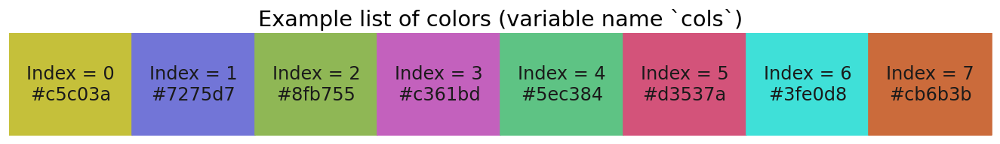

In [46]:
cols = ["#c5c03a","#7275d7","#8fb755","#c361bd","#5ec384","#d3537a","#3fe0d8","#cb6b3b"]
fig, ax = plt.subplots(1,1,figsize=(len(cols)*1.75,1.5),dpi=120)

xvals = np.linspace(0,1,len(cols)+1)
for i in range(len(xvals)-1):
    ax.fill_between([xvals[i],xvals[i+1]],
                     0,1,color=cols[i])
    ax.text(np.mean([xvals[i],xvals[i+1]]),0.5,'Index = %i\n%s'%(i,cols[i]),
            ha='center',va='center',color='.1',fontsize='x-large')
ax.set_xlim(0,1)
ax.set_ylim(0,1)
ax.set_axis_off()
ax.set_title('Example list of colors (variable name `cols`)',fontsize='xx-large')

plt.show()

In [47]:
# get the political leanings and assign them to colors
leanings = nx.get_node_attributes(graph,'political_orientation')
node_colors = [cols[0] if leaning=='conservative' else cols[1] \
               for leaning in leanings.values()]

edge_colors = '.4'

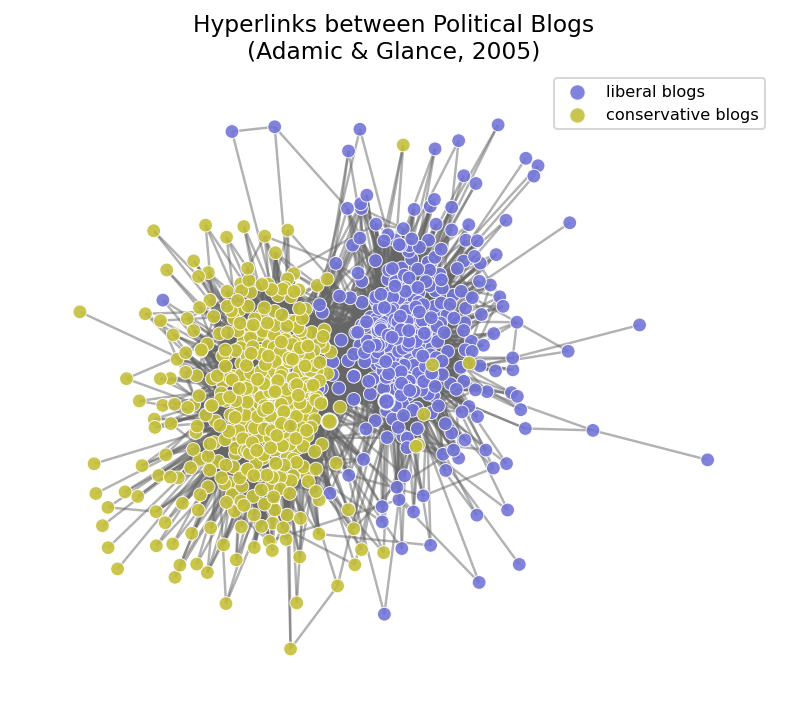

In [48]:
fig, ax = plt.subplots(1,1,figsize=(7,6),dpi=140)

# first assign nodes to a position in the pos dictionary
pos = nx.spring_layout(graph)

# then draw the nodes
nx.draw_networkx_nodes(graph, pos, node_color=node_colors,
                       node_size=50, edgecolors='w', alpha=0.9, linewidths=0.5, ax=ax)

## without node outlines
# nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=50, alpha=0.9, ax=ax)

# then draw the edges
nx.draw_networkx_edges(graph, pos, edge_color=edge_colors, width=1.25, alpha=0.5, ax=ax)

ax.set_title('Hyperlinks between Political Blogs\n(Adamic & Glance, 2005)', fontsize='large')
ax.set_axis_off()

legend_node0 = '0'
legend_node1 = '1000'

##### just for adding legend, is unnecessary #####
nx.draw_networkx_nodes(graph, {legend_node0:pos[legend_node0]}, nodelist=[legend_node0], 
                       label='liberal blogs', 
                       node_color=cols[1], node_size=70, edgecolors='w', alpha=0.9, ax=ax)
nx.draw_networkx_nodes(graph, {legend_node1:pos[legend_node1]}, nodelist=[legend_node1], 
                       label='conservative blogs',
                       node_color=cols[0], node_size=70, edgecolors='w', alpha=0.9, ax=ax)
ax.legend(fontsize='small')

## I tend to save two figures each time:
## - one png, which is good for slides, and
## - one pdf, which is good for papers

plt.savefig('figs/pngs/PolBlogs_network.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/PolBlogs_network.pdf', bbox_inches='tight')
plt.show()

### 1.8.1 Different network layouts

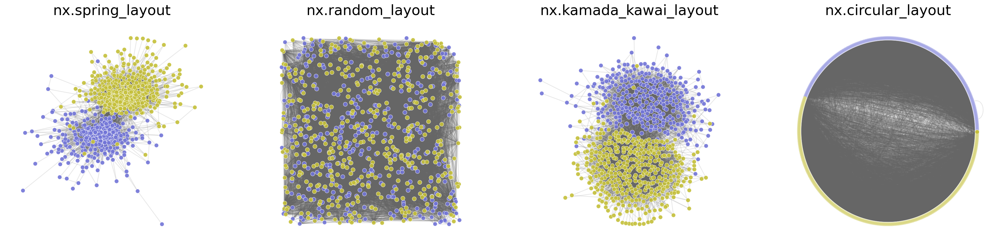

In [49]:
fig, ax = plt.subplots(1,4,figsize=(31,7),dpi=150)
plt.subplots_adjust(wspace=0.2)

pos0 = nx.spring_layout(graph)
pos1 = nx.random_layout(graph)
pos2 = nx.kamada_kawai_layout(graph)
pos3 = nx.circular_layout(graph)

pos_list = [pos0, pos1, pos2, pos3]
pos_titles = ['nx.spring_layout', 'nx.random_layout', 'nx.kamada_kawai_layout', 'nx.circular_layout']

for i,pos in enumerate(pos_list):
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, linewidths=0.5,
                           node_size=50, edgecolors='w', alpha=0.9, ax=ax[i])
    nx.draw_networkx_edges(graph, pos, edge_color=edge_colors, 
                           width=1.25, alpha=0.15, ax=ax[i])
    
    ax[i].set_title(pos_titles[i], fontsize=24)
    ax[i].set_axis_off()

plt.savefig('figs/pngs/PolBlogs_network_4layouts.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/PolBlogs_network_4layouts.pdf', bbox_inches='tight')
plt.show()

## 1.9 Visualizing network properties: Degree Distributions

In [50]:
def plot_degree(degree, number_of_bins=50, log_binning=True, base=2):
    """
    Given a degree sequence, return the y values (probability) and the
    x values (support) of a degree distribution that you're going to plot.
    
    Parameters
    ----------
    degree (np.ndarray or list):
        a vector of length N that corresponds to the degree, k_i, of every
        node, v_i, in the network

    number_of_bins (int):
        length of output vectors
    
    log_binning (bool)
        if you are plotting on a log-log axis, then this is useful
    
    base (int):
        log base, defaults to 2
        
    Returns
    -------
    x, y (np.ndarray):
        the support and probability values of the degree distribution
    
    """
    
    # We need to define the support of our distribution
    lower_bound = min(degree)
    upper_bound = max(degree)
    
    # And the bins
    if log_binning:
        log = np.log2 if base == 2 else np.log10
        lower_bound = log(lower_bound) if lower_bound >= 1 else 0.0
        upper_bound = log(upper_bound)
        bins = np.logspace(lower_bound,upper_bound,number_of_bins, base = base)
    else:
        bins = np.linspace(lower_bound,upper_bound,number_of_bins)
    
    # Then we can compute the histogram using numpy
    y, __ = np.histogram(degree, 
                           bins = bins,
                           density=True)
    # Now, we need to compute for each y the value of x
    x = bins[1:] - np.diff(bins)/2.0
        
    return x, y

In [51]:
x1,y1 = plot_degree(list(in_degree.values()), number_of_bins=80, log_binning=True, base=2)
x2,y2 = plot_degree(list(out_degree.values()), number_of_bins=80, log_binning=True, base=2)

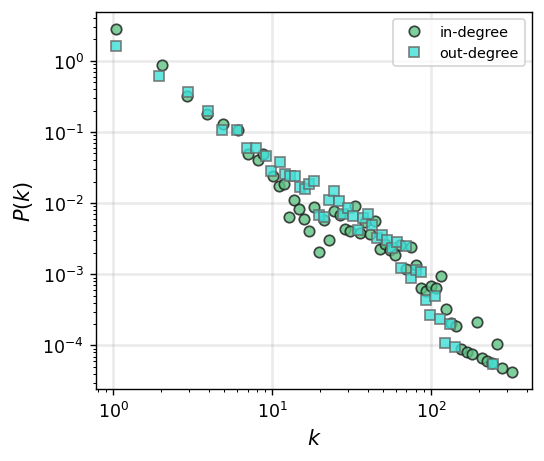

In [52]:
fig, ax = plt.subplots(1,1,figsize=(4.5,4),dpi=125)

ax.loglog(x1, y1,'o', color=cols[4], label='in-degree', alpha=0.8, mec='.1')
ax.loglog(x2, y2,'s', color=cols[6], label='out-degree', alpha=0.8, mec='.4')
ax.set_xlabel(r"$k$",fontsize='large')
ax.set_ylabel(r"$P(k)$",fontsize='large')
ax.legend(fontsize='small')

ax.grid(linewidth=1.5, color='#999999', alpha=0.2, linestyle='-')

plt.savefig('figs/pngs/PolBlogs_inout_degreedist.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/PolBlogs_inout_degreedist.pdf', bbox_inches='tight')
plt.show()

### 1.9.1 Linear binning vs log binning

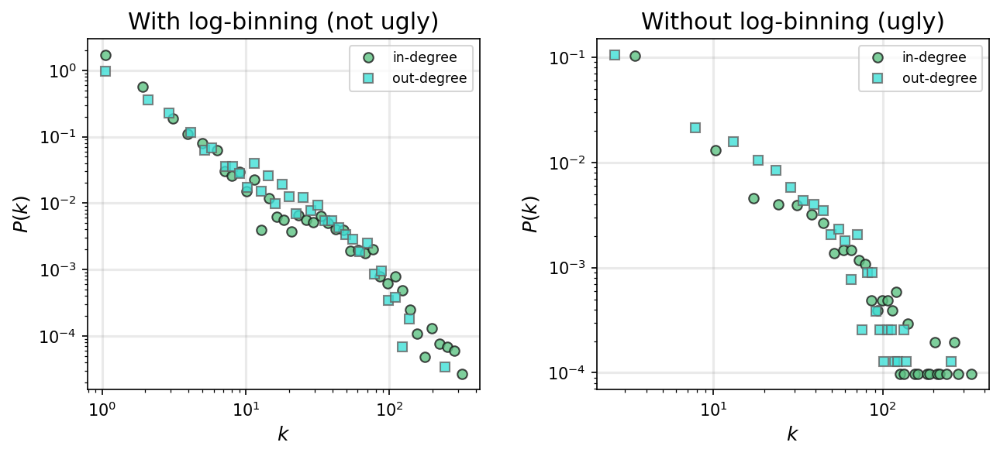

In [53]:
# Note: your plots will look stupid if you don't do log binning...
nbins = 50
fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=150)
plt.subplots_adjust(wspace=0.3)

x1,y1 = plot_degree(list(in_degree.values()), number_of_bins=nbins, log_binning=True, base=2)
x2,y2 = plot_degree(list(out_degree.values()), number_of_bins=nbins, log_binning=True, base=2)
ax[0].loglog(x1, y1,'o', color=cols[4], label='in-degree', alpha=0.8, mec='.1')
ax[0].loglog(x2, y2,'s', color=cols[6], label='out-degree', alpha=0.8, mec='.4')
ax[0].set_xlabel(r"$k$", fontsize='large')
ax[0].set_ylabel(r"$P(k)$", fontsize='large')
ax[0].legend(fontsize='small')
ax[0].grid(linewidth=1.5, color='#999999', alpha=0.2, linestyle='-')
ax[0].set_title('With log-binning (not ugly)', fontsize='x-large')

x1,y1 = plot_degree(list(in_degree.values()), number_of_bins=nbins, log_binning=False, base=2)
x2,y2 = plot_degree(list(out_degree.values()), number_of_bins=nbins, log_binning=False, base=2)
ax[1].loglog(x1, y1,'o', color=cols[4], label='in-degree', alpha=0.8, mec='.1')
ax[1].loglog(x2, y2,'s', color=cols[6], label='out-degree', alpha=0.8, mec='.4')
ax[1].set_xlabel(r"$k$", fontsize='large')
ax[1].set_ylabel(r"$P(k)$", fontsize='large')
ax[1].legend(fontsize='small')
ax[1].grid(linewidth=1.5, color='#999999', alpha=0.2, linestyle='-')
ax[1].set_title('Without log-binning (ugly)', fontsize='x-large')

plt.savefig('figs/pngs/PolBlogs_inout_degreedist_binningcompare.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/PolBlogs_inout_degreedist_binningcompare.pdf', bbox_inches='tight')
plt.show()

_________________

# 2. Network Models
## 2.1 Static Random Graph Models
### 2.1. Erdös-Rényi Model

The original formulation: a $G_{(N,E)}$ graph is constructed starting from a set $V$ of $N$ different vertices connected at random by $E$ edges (Erdös and Rényi, 1959; 1960; 1961).

A variation of this model proposed by Gilbert (1959) constructs a $G_{(N,p)}$ graph from a set $V$ of $N$ different vertices in which each of the possibile $\frac{N(N-1)}{2}$ edges is present with probability $p$ (the _connection probability_).

The two models are statistically equivalent when $N$ goes to infinity with:

$$ \dfrac{pN(N-1)}{2} = E $$

In [54]:
N = 100
p = 0.01
E = p*N*(N-1)*0.5
av_deg = (N-1)*p
er = nx.erdos_renyi_graph(N,p) 
# the function called erdos_renyi actually generates the Gilbert variation of the model

## To generate the original Erdos-Renyi graph use
# er = nx.gnm_random_graph(N,int(E))

## And to generate the Gilbert graph you can also use
# g = nx.gnp_random_graph(N,p)

The average number of edges generated in the construction of the graph is:

$$ \langle E \rangle = \dfrac{N(N-1)p}{2}, $$

and the average degree:

$$ \langle k \rangle = \frac{2\langle E \rangle}{N} = (N-1)p \simeq Np .$$

In [55]:
# the average number of edges generated in the construction of the graph
exp_E = 0.5*N*(N-1)*p 

B = 2000 # number of replications
actual_E = [nx.gnp_random_graph(N,p).number_of_edges() for b in range(B)]

print("Expected mean number of edges: %1.2f" % exp_E)
print("Actual mean number of edges: %1.2f (%d replications)" % (np.mean(actual_E),B))

Expected mean number of edges: 49.50
Actual mean number of edges: 49.36 (2000 replications)


And the average clustering coefficient is equal to:

$$ \langle C \rangle = p = \frac{\langle k \rangle}{N}. $$

In [56]:
N = 1000
p = 0.01
B = 100 # number of replications
actual_av_clustering = [nx.average_clustering(nx.gnp_random_graph(N,p)) for b in range(B)]
print("Expected average clustering coefficient: %1.4f" % p)
print("Actual average clustering coefficient: %1.4f (mean over %i replications)"%(
    np.mean(actual_av_clustering),B))

Expected average clustering coefficient: 0.0100
Actual average clustering coefficient: 0.0099 (mean over 100 replications)


And for a connected network of average degree $\langle k \rangle$ the average shortest path length $\langle l \rangle$ can be approximated by:

$$ \langle l \rangle \simeq \frac{\log N}{\log \langle k \rangle} .$$

## 2.1.2 ER Network - Degree distribution

In the limit for large $N$ the degree distribution $P(k)$ can be approximated by the Poisson distribution:

$$ P(k) = e^{-\langle k \rangle}\frac{\langle k \rangle^k}{k!} $$

Although, before that, it is defined by a Binomial distribution:

$$ P(k) = \binom{N-1}{k} p^k (1-p)^{N-k-1} $$


In [57]:
N = 10**4
p = 0.001
av_deg = (N-1)*p

In [58]:
plt.rc('axes', axisbelow=True)

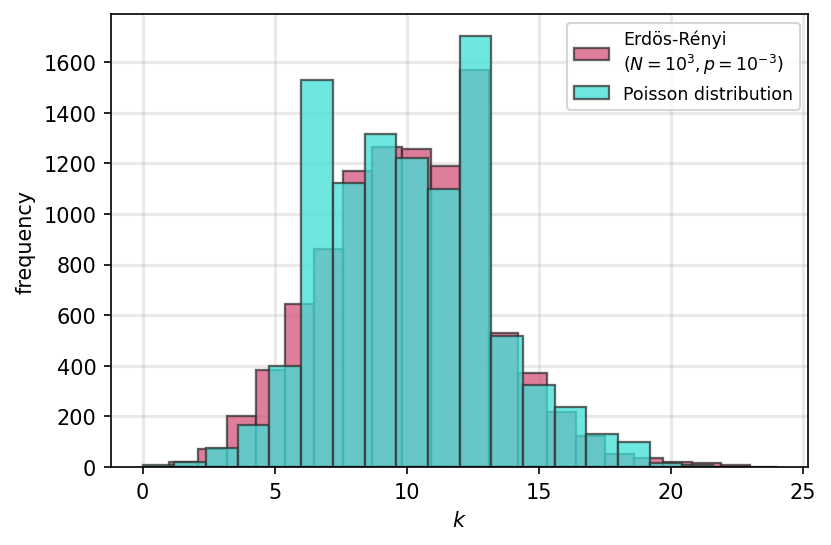

In [59]:
num_bins = 20

fig, ax = plt.subplots(1,1,figsize=(6,4),dpi=150)

g = nx.gnp_random_graph(N,p)
nd = np.array(list(dict(g.degree()).values()))

__ = ax.hist(nd, bins=num_bins, edgecolor='#333333', linewidth=1.1, color=cols[5],
             alpha=0.75, label='Erdös-Rényi\n($N=10^{3}, p=10^{-3}$)')

k = np.random.poisson(av_deg, size=N)
__ = ax.hist(k, bins=num_bins, edgecolor='#333333', linewidth=1.1, color=cols[6],
             alpha=0.75, label='Poisson distribution')

ax.legend(fontsize='small')
ax.grid(linewidth=1.5, color='#999999', alpha=0.2, linestyle='-')

ax.set_xlabel(r"$k$")
ax.set_ylabel("frequency")

plt.savefig('figs/pngs/Pk_ER_vs_poisson.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/Pk_ER_vs_poisson.pdf', bbox_inches='tight')
plt.show()

## 2.2 Powerlaw distributions

In [60]:
# In NetworX this graphs can be generated using
from networkx.utils import powerlaw_sequence
N = 10**6
gammas = np.linspace(2.0,4.0,11)
powerlaw_dict = {gamma:nx.utils.powerlaw_sequence(N, gamma, seed=5) for gamma in gammas}

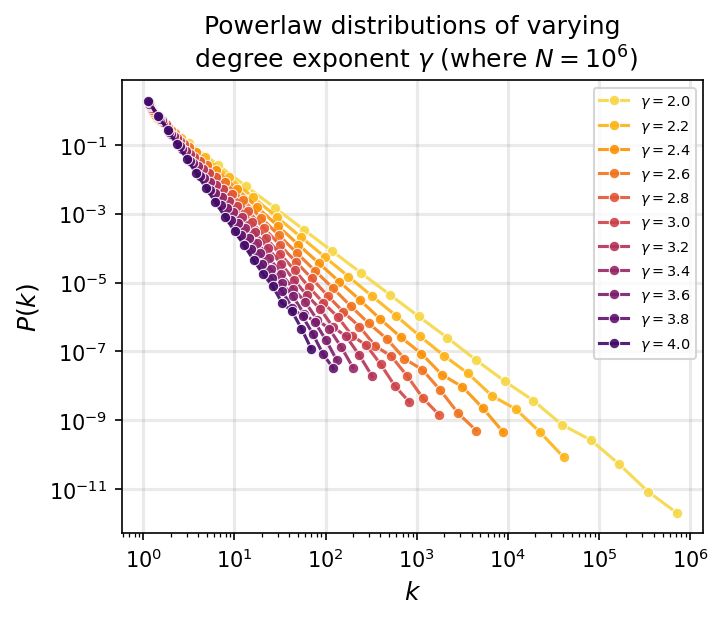

In [61]:
fig, ax = plt.subplots(1,1,figsize=(5,4),dpi=150)

powerlaw_cols = plt.cm.inferno_r(np.linspace(0.1,0.8,len(gammas)))

for i,degree_sequence in enumerate(list(powerlaw_dict.values())):
    x,y = plot_degree(degree_sequence, number_of_bins=20, log_binning=True, base=2)
    nonzero_inds = np.nonzero(y)[0]
    
    ax.loglog(x[nonzero_inds], y[nonzero_inds], 'o-', markersize=5,
              color=powerlaw_cols[i], alpha=0.9, markeredgecolor='w',
              markeredgewidth=0.5,label='$\gamma=%.1f$'%gammas[i])
    
ax.set_xlabel(r"$k$", fontsize='large')
ax.set_ylabel(r"$P(k)$", fontsize='large')
ax.grid(linewidth=1.5, color='#999999', alpha=0.2, linestyle='-')

ax.set_title('Powerlaw distributions of varying\n degree exponent $\gamma$ (where $N = 10^6$)')
ax.legend(fontsize='x-small')

plt.savefig('figs/pngs/powerlaw_exponent_examples.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/powerlaw_exponent_examples.pdf', bbox_inches='tight')
plt.show()

# 2.3 Watts–Strogatz Model
In random graph models the clustering coefficient is determined by the imposed degree distribution and vanishes in the limit of very large graphs. Empirically, we observe very large clustering coefficients in many real-world networks.
The ___Watts-Strogatz model___ allows us to generate graphs with _high clustering_ but also _small average distances_ (Watts & Strogatz, 1998).

The model works as follow: 
1. $N$ vertices are positioned along a ring 
* Each vertex is then symmetrically connected to its 2m nearest neighbors (i.e. $\langle k \rangle = 2m$)
* For every vertex, each edge connected to a clockwise neighbor is randomly rewired with probability $p$, and preserved with probability $1− p$

In [62]:
ps = np.logspace(-4, 0, num=15)
p0 = ps[0]
n_graphs = 10
k = 10
N = 1000

cc_dict = dict(zip(ps, [[]]*len(ps)))
pl_dict = dict(zip(ps, [[]]*len(ps)))

# inits
cc0 = []
pl0 = []
for i in range(n_graphs):
    G = nx.watts_strogatz_graph(N, k, p0)
    cc0.append(nx.average_clustering(G))
    pl0.append(nx.average_shortest_path_length(G))

cc0 = np.mean(cc0)
pl0 = np.mean(pl0)

### Caution: this takes ~2 minutes

In [63]:
import datetime as dt
for i, p in enumerate(ps):
    print(dt.datetime.now(),'--- %02i: p=%.4f'%(i,p))
    cc_list = []
    pl_list = []
    for i in range(n_graphs):
        G = nx.watts_strogatz_graph(N, k, p)
        while not nx.is_connected(G):
            G = nx.watts_strogatz_graph(N, k, p)
        cc_list.append(nx.average_clustering(G))
        pl_list.append(nx.average_shortest_path_length(G))
        
    cc_dict[p] = np.mean(cc_list)    
    pl_dict[p] = np.mean(pl_list)

cc = dict(zip(ps, [0]*len(ps)))
pl = dict(zip(ps, [0]*len(ps)))

for p in ps:
    cc[p] = np.mean(cc_dict[p]) / cc0
    pl[p] = np.mean(pl_dict[p]) / pl0

2023-06-27 14:48:41.536581 --- 00: p=0.0001
2023-06-27 14:48:46.589189 --- 01: p=0.0002
2023-06-27 14:48:51.733600 --- 02: p=0.0004
2023-06-27 14:48:56.825750 --- 03: p=0.0007
2023-06-27 14:49:01.888376 --- 04: p=0.0014
2023-06-27 14:49:06.976688 --- 05: p=0.0027
2023-06-27 14:49:12.115412 --- 06: p=0.0052
2023-06-27 14:49:17.216368 --- 07: p=0.0100
2023-06-27 14:49:22.286626 --- 08: p=0.0193
2023-06-27 14:49:27.316359 --- 09: p=0.0373
2023-06-27 14:49:32.412940 --- 10: p=0.0720
2023-06-27 14:49:37.320296 --- 11: p=0.1389
2023-06-27 14:49:42.038398 --- 12: p=0.2683
2023-06-27 14:49:46.634156 --- 13: p=0.5179
2023-06-27 14:49:50.894435 --- 14: p=1.0000


Let us see how average clustering and average shortest path length vary with $p$:

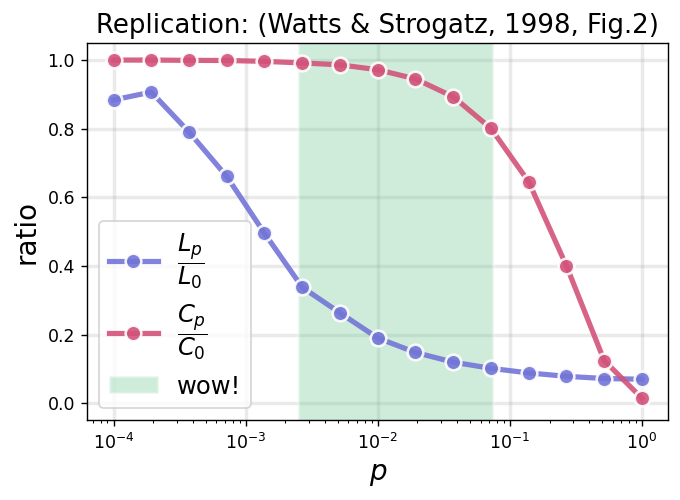

In [64]:
fig, ax = plt.subplots(1,1,figsize=(6,4),dpi=125)

ax.semilogx(ps, list(pl.values()), marker='o', markersize=9.0, color=cols[1],
          alpha=0.9, markeredgecolor='w',markeredgewidth=1.5,
            label=r'$\dfrac{L_{p}}{L_{0}}$', linewidth=3.0)
ax.semilogx(ps, list(cc.values()), marker='o', markersize=9.0, color=cols[-3],
          alpha=0.9, markeredgecolor='w',markeredgewidth=1.5,
            label=r'$\dfrac{C_{p}}{C_{0}}$', linewidth=3.0)

ax.fill_between([0.0025,0.075], -1, 2, label='wow!', facecolor=cols[4], 
                alpha=0.3, edgecolor='w', linewidth=2.0)

ax.set_xlabel(r"$p$", fontsize=16)
ax.set_ylabel("ratio", fontsize=16)
ax.grid(linewidth=2.0, color='#999999', alpha=0.2, linestyle='-')

ax.set_title('Replication: (Watts & Strogatz, 1998, Fig.2)',fontsize=15)
ax.legend(fontsize=14)

ax.set_ylim(-0.05,1.05)
plt.savefig('figs/pngs/Watts_Strogatz_Fig2.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/Watts_Strogatz_Fig2.pdf', bbox_inches='tight')
plt.show()

### Quick note about the above plot: it is arguably the reason all of us are in this room right now
__________

# 2.4 Growing Networks

In [65]:
# In NetworkX we can generate the model using:
N = 100000
m = 3
ba = nx.barabasi_albert_graph(N, m)
degree_sequence = np.array(list(dict(ba.degree()).values()))

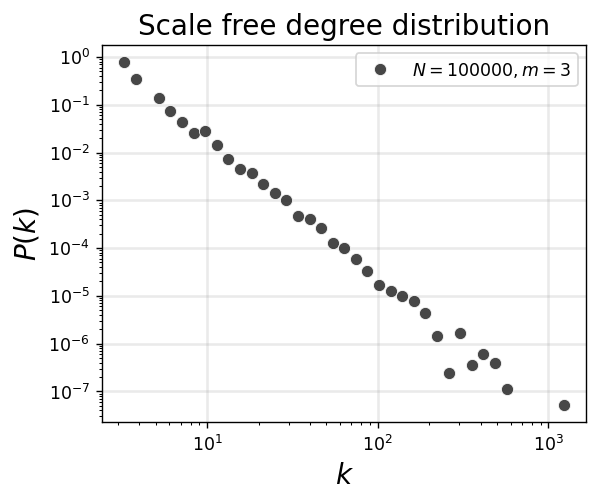

In [66]:
fig, ax = plt.subplots(1,1,figsize=(5,4),dpi=125)

x,y = plot_degree(degree_sequence, number_of_bins=40, log_binning=True, base=2)

nonzero_inds = np.nonzero(y)[0]
ax.loglog(x[nonzero_inds], y[nonzero_inds], 'o', markersize=7,
          color='#333333', alpha=0.9, markeredgecolor='w',
          markeredgewidth=0.5, label='$N=%i, m=%i$'%(N,m))

ax.set_xlabel(r"$k$", fontsize=16)
ax.set_ylabel(r"$P(k)$", fontsize=16)
ax.grid(linewidth=1.5, color='#999999', alpha=0.2, linestyle='-')
ax.set_title('Scale free degree distribution',fontsize=16)
ax.legend()

plt.savefig('figs/pngs/barabasi_albert_degreedist.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/barabasi_albert_degreedist.pdf', bbox_inches='tight')
plt.show()

_____________

### 2.4.1 The Network Zoo
**Phrase from:** [Young, J. G., St-Onge, G., Laurence, E., Murphy, C., Hébert-Dufresne, L., & Desrosiers, P. (2019).](https://doi.org/10.1103/PhysRevX.9.041056https://doi.org/10.1103/PhysRevX.9.041056) Phase transition in the recoverability of network history. *Physical Review X*, 9(4), 041056.

Below are several instantiations of networks grown under a preferential attachment mechanism where new nodes attach their $m$ edges to nodes already in the graph with probability:

$$ \Pi_i = \dfrac{k_i^{\alpha}}{\sum_i k_i^{\alpha}} $$

In [67]:
def preferential_attachment_network(N, alpha=1.0, m=1):
    r"""
    Generates a network based off of a preferential attachment growth rule.
    Under this growth rule, new nodes place their $m$ edges to nodes already
    present in the graph, G, with a probability proportional to $k^\alpha$.

    Parameters
    ----------
    N (int): the desired number of nodes in the final network
    alpha (float): the exponent of preferential attachment. When alpha is less
                   than 1.0, we describe it as sublinear preferential
                   attachment. At alpha > 1.0, it is superlinear preferential
                   attachment. And at alpha=1.0, the network was grown under
                   linear preferential attachment, as in the case of
                   Barabasi-Albert networks.
    m (int): the number of new links that each new node joins the network with.

    Returns
    -------
    G (nx.Graph): a graph grown under preferential attachment.

    """

    G = nx.Graph()
    G = nx.complete_graph(m+1)

    for node_i in range(m+1, N):
        degrees = np.array(list(dict(G.degree()).values()))
        probs = (degrees**alpha) / sum(degrees**alpha)
        eijs = np.random.choice(
                    G.number_of_nodes(), size=(m,),
                    replace=False, p=probs)
        for node_j in eijs:
            G.add_edge(node_i, node_j)

    return G

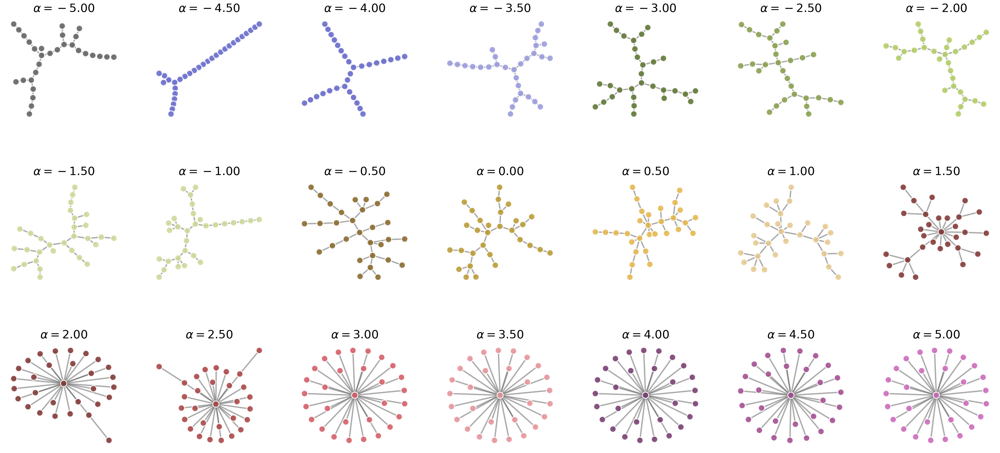

In [68]:
fig, ax = plt.subplots(3,7,figsize=(40,18),dpi=150)
plt.subplots_adjust(hspace=0.5)#,wspace=0.15)

tups=[(0,0), (0,1), (0,2), (0,3), (0,4), (0,5), (0,6), 
      (1,0), (1,1), (1,2), (1,3), (1,4), (1,5), (1,6), 
      (2,0), (2,1), (2,2), (2,3), (2,4), (2,5), (2,6)]
      
N = 30
m = 1
alphas = np.linspace(-5,5,len(tups))
colors = ['.4']+list(plt.cm.tab20b(np.linspace(0.1,0.9,20)))

for ix, alpha in enumerate(alphas):
    G = preferential_attachment_network(N,alpha,m)
    q = tups[ix]
    pos = nx.kamada_kawai_layout(G)
    
    nx.draw_networkx_nodes(G, pos, node_color=[colors[ix]]*N, node_size=200, linewidths=2.0,
                           alpha=0.9, edgecolors='w', ax=ax[q])
    nx.draw_networkx_edges(G, pos, edge_color='#666666', width=3.0, alpha=0.55, ax=ax[q])

    ax[q].set_title(r"$\alpha=%.2f$"%alpha,fontsize=26)
    ax[q].set_axis_off()
    
plt.savefig('figs/pngs/preferential_attachment_alpha.png', dpi=425, bbox_inches='tight')
plt.savefig('figs/pdfs/preferential_attachment_alpha.pdf', bbox_inches='tight')
plt.show()

______________

# 3. Fun datasets and figures

## 3.1 USA commuter network

In [69]:
import pickle
with open('datasets/commuter.pickle', 'rb') as handle:
    commute_network = pickle.load(handle)

In [70]:
G = nx.DiGraph()
for i in list(commute_network.keys()):
    G.add_node(i, pos=commute_network[i]['pos'], 
                  population=commute_network[i]['population'],
                  state=commute_network[i]['state'],
                  housing=commute_network[i]['housing'])
    edge_data = commute_network[i]['edge_data']
    for j in range(len(edge_data['edges'])):
        G.add_edge(i, edge_data['edges'][j],
                   weight=edge_data['weight'][j],
                   margin=edge_data['margin'][j])

In [71]:
pos = dict(nx.get_node_attributes(G,'pos'))
xs = list(list(zip(*list(pos.values())))[0])
ys = list(list(zip(*list(pos.values())))[1])

In [72]:
gp = nx.to_undirected(G)

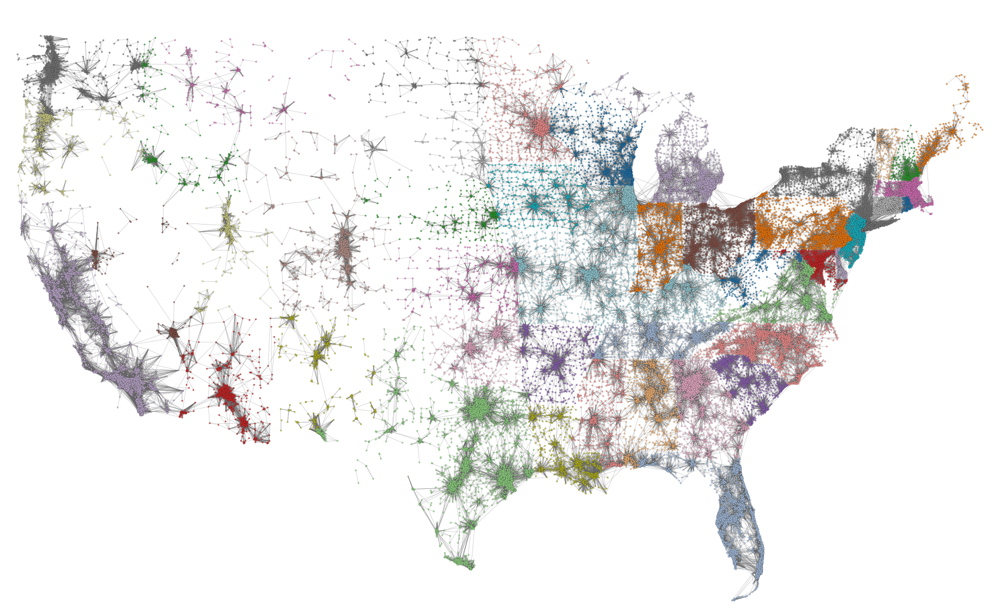

In [73]:
statehood = nx.get_node_attributes(G,'state')
unique_states = np.unique(list(statehood.values()))
np.random.shuffle(unique_states)
nstates = len(unique_states)
cmap_cols = dict(zip(unique_states, plt.cm.tab20_r(np.linspace(0,1,nstates))))
node_colors = [cmap_cols[com] for com in statehood.values()]

mult=1.0
fig, ax = plt.subplots(1,1,figsize=(16*mult,10*mult),dpi=150)

ns = 2.0
ew = 0.25
ec = '#666666'
nc = node_colors

nx.draw_networkx_edges(gp, pos, width=ew, edge_color=ec, ax=ax, alpha=0.5)
nx.draw_networkx_nodes(gp, pos, node_size=ns, node_color=nc, ax=ax, alpha=0.8,
                       edgecolors='.1', linewidths=0.1)

ax.set_axis_off()

xdiff = max(xs)-min(xs)
ydiff = max(ys)-min(ys)

ax.set_ylim(min(ys)-ydiff*0.01, max(ys)+ydiff*0.05)
ax.set_xlim(min(xs)-xdiff*0.01, max(xs)+xdiff*0.01)

plt.savefig('figs/pngs/USA_commutes_statecolors.png', dpi=600, bbox_inches='tight')
plt.savefig('figs/pdfs/USA_commutes_statecolors.pdf', bbox_inches='tight')
plt.show()

## 3.1.1 Community detection

In [74]:
import community

In [75]:
partition = community.best_partition(gp)
communities = np.array(list(partition.values()))
comms = np.unique(communities)
ncomm = len(comms)

cmap_cols1 = plt.cm.tab20b(np.linspace(0,1,int(ncomm/2)+1))
cmap_cols2 = plt.cm.tab20b(np.linspace(0,1,int(ncomm/2)+1))
cmap_cols = list(cmap_cols1) + list(cmap_cols2)

order = np.random.choice(list(range(len(cmap_cols))),size=len(cmap_cols),replace=False)
cmap_cols = [cmap_cols[i] for i in order]
node_colors = [cmap_cols[com] for com in communities]

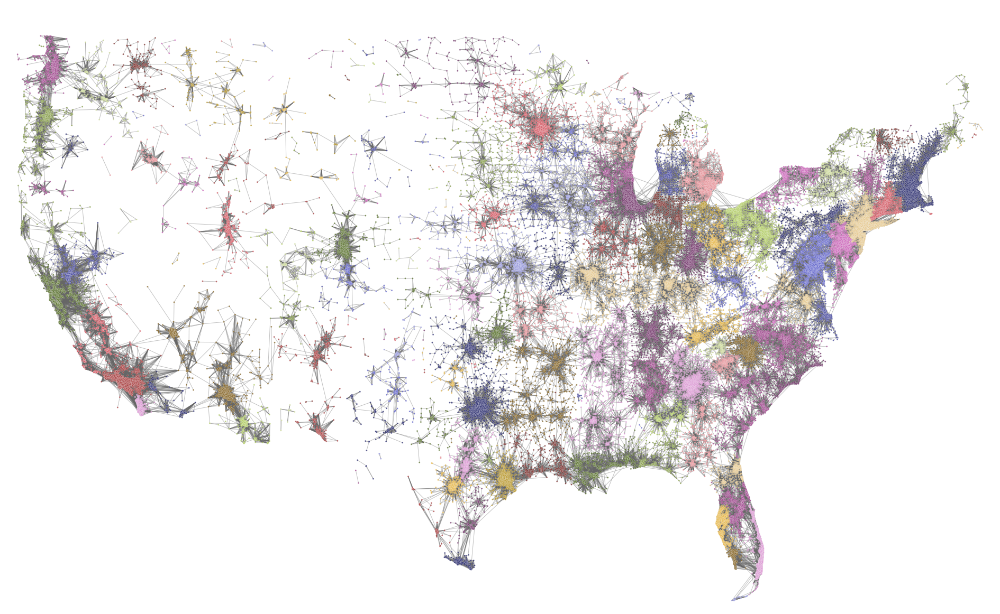

In [76]:
mult=1.0
fig, ax = plt.subplots(1,1,figsize=(16*mult,10*mult),dpi=150)

ns = 2.0
ew = 0.5
ec = '#666666'
nc = node_colors

nx.draw_networkx_edges(gp, pos, width=ew, edge_color=ec, ax=ax, alpha=0.4)
nx.draw_networkx_nodes(gp, pos, node_size=ns, node_color=nc, ax=ax, alpha=0.8,
                       edgecolors='w', linewidths=0.1)

ax.set_axis_off()

xdiff = max(xs)-min(xs)
ydiff = max(ys)-min(ys)

ax.set_ylim(min(ys)-ydiff*0.01, max(ys)+ydiff*0.05)
ax.set_xlim(min(xs)-xdiff*0.01, max(xs)+xdiff*0.01)

plt.savefig('figs/pngs/USA_commutes.png', dpi=600, bbox_inches='tight')
plt.savefig('figs/pdfs/USA_commutes.pdf', bbox_inches='tight')
plt.show()

## 3.1.2 Zooming in: Subsetting the network + `geopandas`

In [77]:
nodes_state = nx.get_node_attributes(gp, 'state')
keep_nodes = [i for i,j in nodes_state.items() if j in ['CA','AZ','NV','OR']]

In [78]:
import geopandas as gpd

state_shp = gpd.read_file('datasets/tl_2017_us_state/')
sta_shp = state_shp.loc[~(state_shp['STATEFP'].isin(['78','60','72','66','02','15','69']))].copy()
sta_shp = sta_shp.rename(columns={'GEOID':'location_id'})

# sta_shp.crs = {"init": "epsg:4326"}
# sta_shp = sta_shp.to_crs(epsg=3395)

In [79]:
gpx = nx.subgraph(gp,keep_nodes)

# partition = community.best_partition(gpx)
communities = np.array(list(partition.values()))
comms = np.unique(communities)
ncomm = len(comms)

cmap_cols2 = plt.cm.tab20b(np.linspace(0,1,int(ncomm/3)+1))
cmap_cols1 = plt.cm.Set3(np.linspace(0,1,int(ncomm/3)+1))
cmap_cols3 = plt.cm.Dark2(np.linspace(0,1,int(ncomm/3)+1))
cmap_cols = list(cmap_cols1) + list(cmap_cols2) + list(cmap_cols3)
order = np.random.choice(list(range(len(cmap_cols))),size=len(cmap_cols),replace=False)
order = list(range(len(cmap_cols)))
cmap_cols = [cmap_cols[i] for i in order]
node_colors = {i:cmap_cols[com] for i,com in partition.items()}

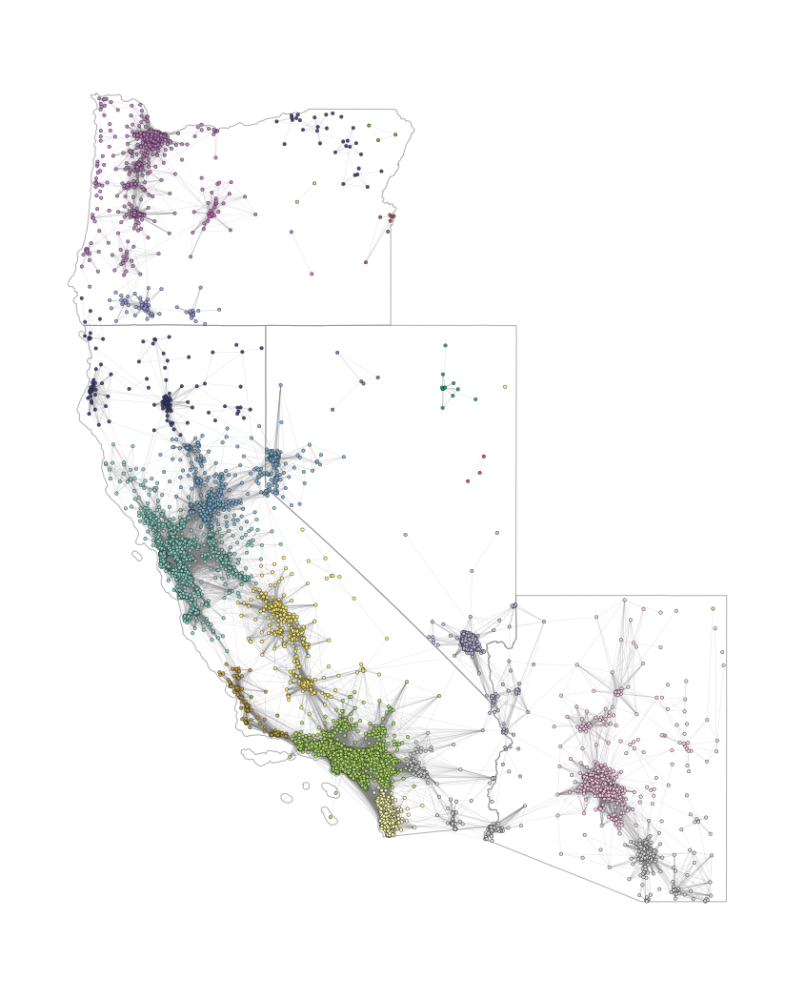

In [80]:
pos = dict(nx.get_node_attributes(gpx,'pos'))
xs = list(list(zip(*list(pos.values())))[0])
ys = list(list(zip(*list(pos.values())))[1])

mult=1.0
fig, ax = plt.subplots(1,1,figsize=(8*mult,8*mult),dpi=150)

ns = 2.75
ew = 0.25
ec = '.5'
nc = [node_colors[i] for i in gpx.nodes()]

sta_shp.loc[sta_shp['STATEFP'].isin(['04','41','32','06'])].plot(ax=ax,
                             ec='0.5', fc='None', lw=0.5, alpha=0.6)

nx.draw_networkx_edges(gpx, pos, width=ew, edge_color=ec, ax=ax, alpha=0.2)
nx.draw_networkx_nodes(gpx, pos, node_size=ns, node_color=nc, ax=ax, alpha=0.9,
                       edgecolors='.1', linewidths=0.2)

ax.set_axis_off()

plt.savefig('figs/pngs/cali_commutes_bright.png', dpi=600, bbox_inches='tight', transparent=False)
plt.show()

### 3.1.3 Plot with dark background

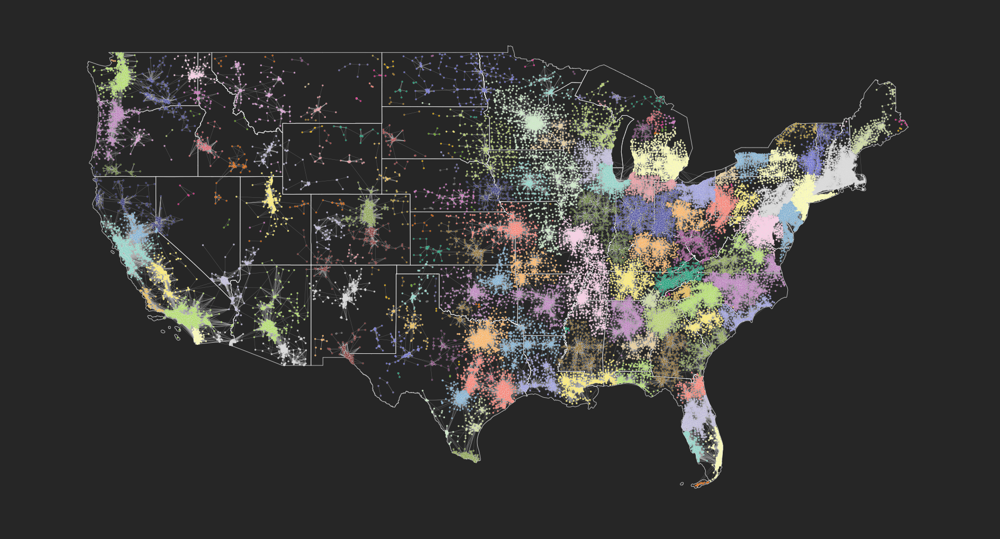

In [81]:
partition = community.best_partition(gp)
communities = np.array(list(partition.values()))
comms = np.unique(communities)
ncomm = len(comms)

cmap_cols2 = plt.cm.tab20b(np.linspace(0,1,int(ncomm/3)+1))
cmap_cols1 = plt.cm.Set3(np.linspace(0,1,int(ncomm/3)+1))
cmap_cols3 = plt.cm.Dark2(np.linspace(0,1,int(ncomm/3)+1))
cmap_cols = list(cmap_cols1) + list(cmap_cols2) + list(cmap_cols3)
order = np.random.choice(list(range(len(cmap_cols))),size=len(cmap_cols),replace=False)
order = list(range(len(cmap_cols)))
cmap_cols = [cmap_cols[i] for i in order]
node_colors = [cmap_cols[com] for com in communities]

pos = dict(nx.get_node_attributes(gp,'pos'))
xs = list(list(zip(*list(pos.values())))[0])
ys = list(list(zip(*list(pos.values())))[1])


################################################################################################
mult=1.0
fig, ax = plt.subplots(1,1,figsize=(14*mult,10*mult),dpi=150,facecolor='.15')

ns = 2.25
ew = 0.25
ec = '.7'
nc = node_colors

sta_shp.plot(ax=ax, ec='w', fc='None', lw=0.5, alpha=0.7)

nx.draw_networkx_edges(gp, pos, width=ew, edge_color=ec, ax=ax, alpha=0.4)
nx.draw_networkx_nodes(gp, pos, node_size=ns, node_color=nc, ax=ax, alpha=0.9,
                       edgecolors='.9', linewidths=0.1)

ax.set_axis_off()
ax.set_facecolor('.2')

plt.savefig('figs/pngs/USA_commutes_bright_darkbkgd.png',
            dpi=600, bbox_inches='tight', facecolor='.15')

plt.show()

____________________

# 4.0 Mobility flow + Maps: UK B117 Figure

In [82]:
# network communities
import infomap

In [83]:
import pandas as pd

In [ ]:
month_dict = {'01':'Jan','02':'Feb','03':'Mar','04':'Apr','05':'May','06':'Jun',
              '07':'Jul','08':'Aug','09':'Sep','10':'Oct','11':'Nov','12':'Dec'}

today = str(dt.datetime.date(dt.datetime.now()))

# make DATE_DF, a simple dataframe with dates, weekdays, and weeknums
weekday_mapping = {0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',
                   4:'Friday',5:'Saturday',6:'Sunday'}

alldates = pd.date_range(start='2019-10-03', end='2021-12-31').tolist()
datelist = [str(i.date()) for i in alldates]
weekdays = [weekday_mapping[i.date().weekday()] for i in alldates]
weeklist = [i//7 for i in range(len(alldates))]
DATE_DF = pd.DataFrame({'date':datelist,'day':weekdays,'week':weeklist})
DATE_DF = DATE_DF.loc[DATE_DF['date']<=today].copy()
DATERANGE = DATE_DF['date'].tolist()
date_dict = dict(zip(DATERANGE,list(range(len(DATERANGE)))))

DATE_DF = DATE_DF.merge(DATE_DF.loc[DATE_DF['day']=='Sunday'
                                   ].rename(columns={'date':'week_of'
                                })[['week_of','week']], how='left', on='week')
DATE_DF_w = DATE_DF.loc[DATE_DF['day']=='Sunday'][['week_of','week']]

In [84]:
manchester_ix = ['E06000006', 'E06000007', 'E06000008', 'E06000009',
                 'E07000037', 'E07000117', 'E07000118', 'E07000119',
                 'E07000120', 'E07000121', 'E07000122', 'E07000123',
                 'E07000124', 'E07000125', 'E07000126', 'E07000127',
                 'E07000128', 'E07000163', 'E08000001', 'E08000002',
                 'E08000003', 'E08000004', 'E08000005', 'E08000006',
                 'E08000007', 'E08000008', 'E08000009', 'E08000010',
                 'E08000011', 'E08000012', 'E08000013', 'E08000014',
                 'E08000015', 'E08000032', 'E08000033']
london_ix = ['E06000034', 'E07000068', 'E07000098', 'E07000102',
             'E07000103', 'E07000107', 'E07000111', 'E07000115',
             'E07000207', 'E07000208', 'E07000212', 'E07000213',
             'E09000001', 'E09000002', 'E09000003', 'E09000004',
             'E09000005', 'E09000006', 'E09000007', 'E09000008',
             'E09000009', 'E09000010', 'E09000011', 'E09000012',
             'E09000013', 'E09000014', 'E09000015', 'E09000016',
             'E09000017', 'E09000018', 'E09000019', 'E09000020',
             'E09000021', 'E09000022', 'E09000023', 'E09000024',
             'E09000025', 'E09000026', 'E09000027', 'E09000028',
             'E09000029', 'E09000030', 'E09000031', 'E09000032', 'E09000033']
scotland_ix = ['S12000005', 'S12000008', 'S12000010', 'S12000011', 'S12000014',
               'S12000018', 'S12000019', 'S12000021', 'S12000026', 'S12000029',
               'S12000030', 'S12000036', 'S12000038', 'S12000039', 'S12000040',
               'S12000045', 'S12000047', 'S12000049', 'S12000050']

In [85]:
fn_uk_base = 'datasets/google_converted_movements.csv'
uk_df = pd.read_csv(fn_uk_base).iloc[:,1:]
uk_df['week_of'] = [i.split('/')[2]+'-'+i.split('/')[1]+'-'+i.split('/')[0]
                    for i in uk_df['week_start'].values]

uk_df = uk_df[['week_of','origin','destination',
                 'movement','converted_movements']].merge(DATE_DF_w,
                                                  how='left', on='week_of')
uk_df = uk_df.loc[uk_df['week']>0].copy()
uk_df = uk_df.sort_values(['week_of','origin']).reset_index().iloc[:,1:]
uk_df = uk_df[['week_of','week','origin','destination',
                 'movement','converted_movements']].copy()

mun_nodes = np.unique(uk_df['origin'].str[:].tolist() +\
                      uk_df['destination'].str[:].tolist())
mun_relabel = dict(zip(mun_nodes, list(range(len(mun_nodes)))))
relabel_mun = {j:i for i,j in mun_relabel.items()}

In [86]:
gdf = gpd.read_file('datasets/Local_Authority_Districts_UK/')
gdf = gdf.rename(columns = {'lad19cd':'origin','lad19nm':'origin_name'})
gdf['centroid'] = gdf['geometry'].centroid

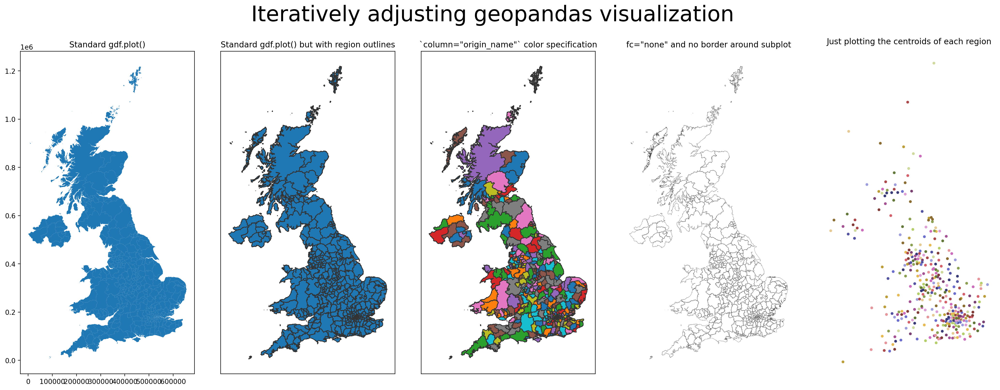

In [87]:
fig, ax = plt.subplots(1,5,figsize=(26,9),dpi=200)
plt.subplots_adjust(wspace=0.15)

gdf.plot(ax=ax[0])
ax[0].set_title('Standard gdf.plot()')

gdf.plot(ax=ax[1], ec='.2')
ax[1].set_title('Standard gdf.plot() but with region outlines')
ax[1].set_xticks([])
ax[1].set_yticks([])

gdf.plot(ax=ax[2], ec='.2', column='origin_name')
ax[2].set_title('`column="origin_name"` color specification')
ax[2].set_xticks([])
ax[2].set_yticks([])

gdf.plot(ax=ax[3], ec='.2', lw=0.5, fc='none', alpha=0.4)
ax[3].set_axis_off()
ax[3].set_title('fc="none" and no border around subplot')

colors_uk = plt.cm.tab20b(np.linspace(0,1,gdf.shape[0]))
np.random.shuffle(colors_uk)
gdf['centroid'].plot(ax=ax[4], color=colors_uk,
                     lw=0.25, markersize=15)
ax[4].set_axis_off()
ax[4].set_title('Just plotting the centroids of each region')

plt.suptitle('Iteratively adjusting geopandas visualization', fontsize=32)

plt.savefig('figs/pngs/geopandas_practice_plotting.png', dpi=425, bbox_inches='tight')

plt.show()

In [88]:
def get_infomap_communities(G, level='--two-level'):
    """
    Wrapper to get infomap communities from the infomap package.
    """
    infomapX = infomap.Infomap(level)
    for e in list(G.edges()):
        infomapX.network.addLink(*e)

    infomapX.run();

    comms = {}
    for node in infomapX.iterLeafNodes():
        comms[node.physicalId] = node.moduleIndex()
    
    return comms

In [89]:
g_dict_w = {}
p_dict_w_inf = {}

for w in sorted(uk_df.week_of.unique()[1:]):  # span through all the weeks in the data
    # for each week, make a new network---we're gonna add this to the dictionary above
    df_w = uk_df.loc[uk_df['week_of']==w].copy()
    G_w = nx.DiGraph()
    G_w.add_nodes_from(mun_nodes)
    wel_w = [(df_w['origin'].values[i],
              df_w['destination'].values[i],
              df_w['movement'].values[i]) for i in range(df_w.shape[0])]
    G_w.add_weighted_edges_from(wel_w)
    G_w_rl = nx.relabel_nodes(G_w, mun_relabel)
    # add the networkx object to the dictionary storing all the networks
    g_dict_w[w] = G_w  

    # for each week's network, let's get the Infomap communities
    partition_informap_w = get_infomap_communities(G_w_rl)
    p_dict_w_inf[w] = {relabel_mun[i]:j for i,j in partition_informap_w.items()}

In [90]:
ref_weeks = [11,12,13,14,15,16,17,18,19,20]
week_df = uk_df[['week','week_of']].drop_duplicates()
week_dict = dict(zip(week_df['week'].values,week_df['week_of']))

uk_df_ref = uk_df.loc[uk_df['week'].isin(ref_weeks)].groupby(['origin','destination']
                              ).agg({'movement':np.nanmean,
                                     'converted_movements':np.nanmean}).reset_index()

G_ref = nx.DiGraph()
G_ref.add_nodes_from(mun_nodes)
wel_ref = [(uk_df_ref['origin'].values[i],
            uk_df_ref['destination'].values[i],
            uk_df_ref['movement'].values[i]) for i in range(uk_df_ref.shape[0])]
G_ref.add_weighted_edges_from(wel_ref)
G_ref_rl = nx.relabel_nodes(G_ref, mun_relabel)

# for each week's network, let's get the Infomap communities
partition_informap_ref = get_infomap_communities(G_ref_rl)
partition_informap_ref = {relabel_mun[i]:j
                          for i,j in partition_informap_ref.items()}

gdfx = gdf.merge(pd.DataFrame({"origin":list(partition_informap_ref.keys()),
                               "comm":list(partition_informap_ref.values())}),
                 how='left', on='origin')

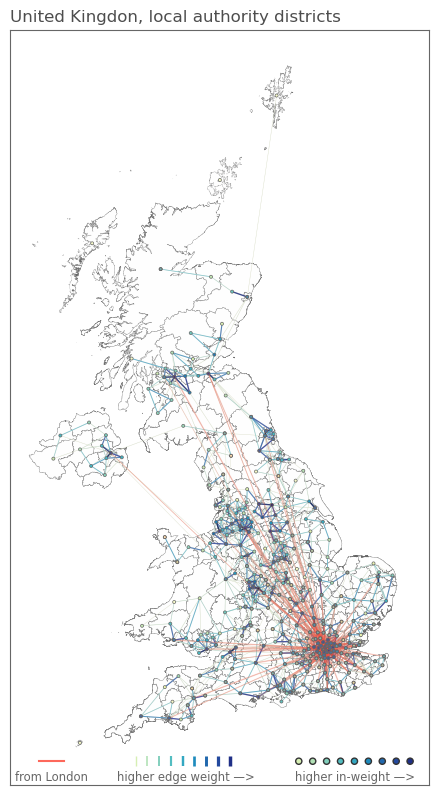

In [91]:
col = '#FD685B'
colX = [0.992, 0.318, 0.259, 0.9]

cmaa = plt.cm.YlGnBu_r
# cmaa = plt.cm.cividis
wx = 57
wi = uk_df['week_of'].unique()[wx]
w = 6; h = 10

fig, ax00 = plt.subplots(1,1,figsize=(w,h),dpi=100)

ax00.set_title('United Kingdon, local authority districts',
           ha='left',x=0, fontsize='large', color='.3')

mov_gw = uk_df.loc[uk_df['week_of']==wi].copy()
mov_gw['sizes'] = (np.log(mov_gw['movement'])-np.log(mov_gw['movement']).min()+1).values

uk_shp = gdf.copy()
uk_shp = uk_shp.merge(mov_gw[['origin','sizes']], how='left', on='origin')

uk_map = uk_shp.plot(ax=ax00,fc='.995',ec='.4',lw=0.2,alpha=0.6,zorder=0)

uk_map.set_rasterized(True)

pos_mun = {gdf['origin'].values[i]:(gdf['centroid'].values[i].x, 
                                    gdf['centroid'].values[i].y)
           for i in range(gdf.shape[0])}

G_ref = nx.DiGraph()
G_ref.add_nodes_from(mun_nodes)
wel_ref = [(mov_gw['origin'].values[i],
            mov_gw['destination'].values[i],
            mov_gw['movement'].values[i]) for i in range(mov_gw.shape[0])]
G_ref.add_weighted_edges_from(wel_ref)
G_ref_rl = nx.relabel_nodes(G_ref, mun_relabel)

# for each week's network, let's get the Infomap communities
partition_informap_ref = get_infomap_communities(G_ref_rl)
partition_informap_ref = {relabel_mun[i]:j
                          for i,j in partition_informap_ref.items()}
Gcc_w = G_ref.to_undirected()

Gcc_w.remove_edges_from(nx.selfloop_edges(Gcc_w))

nsb = 5
tmp_nc = pd.DataFrame([[i[0],i[1],i[2]['weight']]
                       for i in list(G_ref.edges(data=True))],
                      columns=['origin','destination','movement'])
ncw_df = tmp_nc.groupby('destination').agg({'movement':'sum'}).reset_index()
ncw = dict(zip(ncw_df['destination'].values,ncw_df['movement'].values))
nc_w = np.array(list(ncw.values()))
ncw_w = np.log(nc_w) - np.quantile(np.log(nc_w),.2) + 1
ncw_w[ncw_w<0] = 0
ncw_w = cmaa(((np.nanmax(ncw_w)-ncw_w)/(np.nanmax(ncw_w)-np.nanmin(ncw_w)))-0.05)
ncw = dict(zip(ncw_df['destination'].values,ncw_w))
ncw = {i:ncw[i] if i in list(ncw.keys()) else '.8' for i in list(Gcc_w.nodes())}

nc_w = [ncw[i] for i in list(Gcc_w.nodes())]
ns_w = [nsb-1 for i in list(Gcc_w.nodes())]

tmp_ew = pd.DataFrame([[i[0],i[1],i[2]['weight']]
                       for i in list(Gcc_w.edges(data=True))],
                      columns=['origin','destination','movement'])
tmp_ew = tmp_ew.sort_values('movement').reset_index().iloc[:,1:]
ord_el = list(zip(tmp_ew['origin'].values,tmp_ew['destination'].values))

ew_dict = nx.get_edge_attributes(Gcc_w, 'weight')
ew_dict = {i:ew_dict[i] for i in ord_el}
ew_w = np.array(list(ew_dict.values()))
alphs = (np.log(ew_w)-min(np.log(ew_w))+1)
alphs = alphs / max(alphs) / 1.5 + 0.25
ews_w = np.log(ew_w) - min(np.log(ew_w)) + 1
ews_w = ews_w / 12 * 1.5 + 0.1
ecs_w = cmaa(((np.nanmax(ews_w)-ews_w)/(np.nanmax(ews_w)-np.nanmin(ews_w)))-0.1)
ecs_wl = []
for ei,ec_i in enumerate(ecs_w):
    ec_i[-1] = alphs[ei]
    ecs_wl.append(ec_i)   

ecs_w = ecs_wl

nodes = nx.draw_networkx_nodes(Gcc_w, pos_mun, node_size=np.array(ns_w)*1.2, linewidths=0.5, 
                       node_color=nc_w, edgecolors='.4', ax=ax00)
edges1 = nx.draw_networkx_edges(Gcc_w, pos_mun, edgelist=ord_el, width=ews_w,
                               edge_color='.85', ax=ax00)
edges = nx.draw_networkx_edges(Gcc_w, pos_mun, edgelist=ord_el, width=ews_w,
                               edge_color=ecs_w, ax=ax00)

london_ixL = uk_df.loc[uk_df['origin'].isin(london_ix)]['destination'].unique()
G_lon = nx.subgraph(G_ref, london_ixL)
lon_el = [i for i in G_lon.edges() if i[0] in london_ix or i[1] in london_ix]
ew_dict = {i:j for i,j in nx.get_edge_attributes(G_lon, 'weight').items()
           if i in lon_el or (i[1],i[0]) in lon_el}

lon_el = [i for i in G_lon.edges() if i[0] in london_ix or i[1] in london_ix]
G_lon = nx.subgraph(Gcc_w, london_ixL)
ew_dict = {i:j for i,j in nx.get_edge_attributes(G_lon, 'weight').items() if i in lon_el}
ew_w = np.array(list(ew_dict.values()))
alphs = (np.log(ew_w)-min(np.log(ew_w))+1)
alphs = alphs / max(alphs) / 1.5 + 0.125
ews_w = np.log(ew_w) - min(np.log(ew_w)) + 1
# ews_w = ews_w / max(ews_w) * 1.5 + 0.1
ews_w = ews_w / 12 * 1.5 + 0.1
ecs_w = [colX for i in ews_w]
ecs_wl = []
for ei,ec_i in enumerate(ecs_w):
    ec_i[-1] = alphs[ei]/1.25
    ecs_wl.append(ec_i)

ecs_w = ecs_wl
edgesL = nx.draw_networkx_edges(G_lon, pos_mun, edgelist=lon_el,
                                width=ews_w+0.1, edge_color=ecs_w, ax=ax00)
nodesL = nx.draw_networkx_nodes(G_lon, pos_mun, node_size=5, linewidths=0.5,
           node_color=[colX]*G_lon.number_of_nodes(), edgecolors='.4', ax=ax00)


nodes.set_zorder(20000)
edges1.set_zorder(18)
edges.set_zorder(19)
nodesL.set_zorder(20002)
edgesL.set_zorder(20)

ax00_sub = ax00.inset_axes([0, 0, 1, 0.045])
ax00_sub.vlines(np.linspace(0.3,0.525,9), 0.55, 0.85,
                color=cmaa(np.linspace(0.8,0.1,9)),
                lw=np.linspace(1, 2.5, 9))
ax00_sub.text(0.42, 0.05, 'higher edge weight —>', fontsize='small',
              color='.4', ha='center', va='bottom')

ax00_sub.scatter(np.linspace(0.69,0.956,9), [0.7]*9,
                c=cmaa(np.linspace(0.8,0.1,9)),ec='.2',s=20)
ax00_sub.text(0.825, 0.05, 'higher in-weight —>', fontsize='small',
              color='.4', ha='center', va='bottom')

ax00_sub.plot([0.07,0.13], [0.7,.7],
               color=col,lw=1.5)
ax00_sub.text(0.1, 0.05, 'from London', fontsize='small',
              color='.4', ha='center', va='bottom')

ax00_sub.set_xlim(0,1)
ax00_sub.set_ylim(0,1)
ax00_sub.set_axis_off()

for l in ['bottom','top','left','right']:
    ax00.spines[l].set_color('.4')

ax00.set_xticks([])
ax00.set_yticks([])

plt.savefig('figs/pngs/uk_ref.png',dpi=600,bbox_inches='tight')
plt.savefig('figs/pdfs/uk_ref.pdf',dpi=425,bbox_inches='tight')
plt.show()

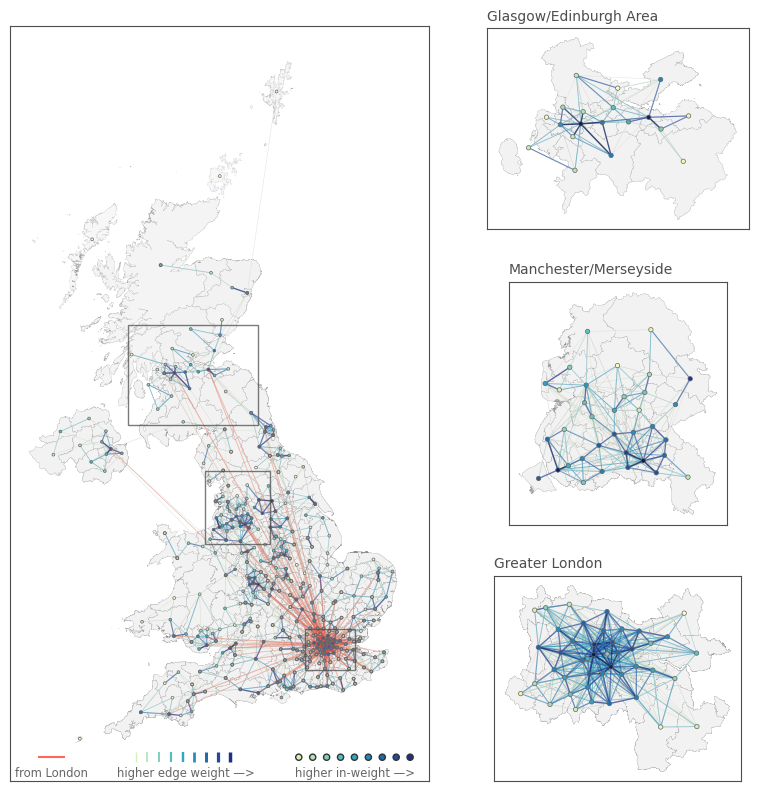

In [93]:
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Rectangle

col = '#FD685B'
colX = [0.992, 0.318, 0.259, 0.9]

cmaa = plt.cm.YlGnBu_r
wx = 57
wi = uk_df['week_of'].unique()[wx]
w = 10; h = 10
fig = plt.figure(figsize=(w,h),dpi=150)

gs = GridSpec(6, 6, figure=fig, height_ratios=[0.6,1,1,1,1,0.6],
              width_ratios=[-0.45,2,1,1,1,1])

ax00 = fig.add_subplot(gs[0:6, 0:4])
ax04 = fig.add_subplot(gs[0:2, 4:6])
ax03 = fig.add_subplot(gs[2:4, 4:6])
ax02 = fig.add_subplot(gs[4:6, 4:6])

# ax00.set_title('United Kingdon, local authority districts\n'+\
#                '(week starting 29 November, 2020)',
#            ha='left',x=0, fontsize='large', color='.3')

mov_gw = uk_df.loc[uk_df['week_of']==wi].copy()
mov_gw['sizes'] = (np.log(mov_gw['movement'])-np.log(mov_gw['movement']).min()+1).values

uk_shp = gdf.copy()
uk_shp = uk_shp.merge(mov_gw[['origin','sizes']], how='left', on='origin')

lo_shp = uk_shp.loc[uk_shp['origin'].isin(london_ix)].copy()
ma_shp = uk_shp.loc[uk_shp['origin'].isin(manchester_ix)].copy()
sc_shp = uk_shp.loc[uk_shp['origin'].isin(scotland_ix)].copy()

uk_map = uk_shp.plot(ax=ax00, fc='.95', ec='.55', lw=0.1, alpha=0.6,zorder=0)
lo_map = lo_shp.plot(ax=ax02, fc='.95', ec='.55', lw=0.1, alpha=0.6)
ma_map = ma_shp.plot(ax=ax03, fc='.95', ec='.55', lw=0.1, alpha=0.6)
sc_map = sc_shp.plot(ax=ax04, fc='.95', ec='.55', lw=0.1, alpha=0.6)

uk_map.set_rasterized(True)
lo_map.set_rasterized(True)
ma_map.set_rasterized(True)
sc_map.set_rasterized(True)

pos_mun = {gdf['origin'].values[i]:(gdf['centroid'].values[i].x, 
                                    gdf['centroid'].values[i].y)
           for i in range(gdf.shape[0])}

G_ref = nx.DiGraph()
G_ref.add_nodes_from(mun_nodes)
wel_ref = [(mov_gw['origin'].values[i],
            mov_gw['destination'].values[i],
            mov_gw['movement'].values[i]) for i in range(mov_gw.shape[0])]
G_ref.add_weighted_edges_from(wel_ref)
G_ref_rl = nx.relabel_nodes(G_ref, mun_relabel)

# for each week's network, let's get the Infomap communities
partition_informap_ref = get_infomap_communities(G_ref_rl)
partition_informap_ref = {relabel_mun[i]:j
                          for i,j in partition_informap_ref.items()}
Gcc_w = G_ref.to_undirected()


Gcc_w.remove_edges_from(nx.selfloop_edges(Gcc_w))

nsb = 5
tmp_nc = pd.DataFrame([[i[0],i[1],i[2]['weight']]
                       for i in list(G_ref.edges(data=True))],
                      columns=['origin','destination','movement'])
ncw_df = tmp_nc.groupby('destination').agg({'movement':'sum'}).reset_index()
ncw = dict(zip(ncw_df['destination'].values,ncw_df['movement'].values))
nc_w = np.array(list(ncw.values()))
ncw_w = np.log(nc_w) - np.quantile(np.log(nc_w),.2) + 1
ncw_w[ncw_w<0] = 0
ncw_w = cmaa(((np.nanmax(ncw_w)-ncw_w)/(np.nanmax(ncw_w)-np.nanmin(ncw_w)))-0.05)
ncw = dict(zip(ncw_df['destination'].values,ncw_w))
ncw = {i:ncw[i] if i in list(ncw.keys()) else '.8' for i in list(Gcc_w.nodes())}

nc_w = [ncw[i] for i in list(Gcc_w.nodes())]
ns_w = [nsb-1 for i in list(Gcc_w.nodes())]

tmp_ew = pd.DataFrame([[i[0],i[1],i[2]['weight']]
                       for i in list(Gcc_w.edges(data=True))],
                      columns=['origin','destination','movement'])
tmp_ew = tmp_ew.sort_values('movement').reset_index().iloc[:,1:]
ord_el = list(zip(tmp_ew['origin'].values,tmp_ew['destination'].values))

ew_dict = nx.get_edge_attributes(Gcc_w, 'weight')
ew_dict = {i:ew_dict[i] for i in ord_el}
ew_w = np.array(list(ew_dict.values()))
alphs = (np.log(ew_w)-min(np.log(ew_w))+1)
alphs = alphs / max(alphs) / 1.5 + 0.125
ews_w = np.log(ew_w) - min(np.log(ew_w)) + 1
# ews_w = ews_w / max(ews_w) * 1.5 + 0.1
ews_w = ews_w / 12 * 1.5 + 0.1
ecs_w = cmaa(((np.nanmax(ews_w)-ews_w)/(np.nanmax(ews_w)-np.nanmin(ews_w)))-0.1)
ecs_wl = []
for ei,ec_i in enumerate(ecs_w):
    ec_i[-1] = alphs[ei]
    ecs_wl.append(ec_i)   

ecs_w = ecs_wl
nodes = nx.draw_networkx_nodes(Gcc_w, pos_mun, node_size=ns_w, linewidths=0.5, 
                       node_color=nc_w, edgecolors='.4', ax=ax00)
edges1 = nx.draw_networkx_edges(Gcc_w, pos_mun, edgelist=ord_el, width=ews_w,
                               edge_color='.85', ax=ax00)
edges = nx.draw_networkx_edges(Gcc_w, pos_mun, edgelist=ord_el, width=ews_w,
                               edge_color=ecs_w, ax=ax00)

london_ixL = uk_df.loc[uk_df['origin'].isin(london_ix)]['destination'].unique()
G_lon = nx.subgraph(G_ref, london_ixL)
lon_el = [i for i in G_lon.edges() if i[0] in london_ix or i[1] in london_ix]
ew_dict = {i:j for i,j in nx.get_edge_attributes(G_lon, 'weight').items()
           if i in lon_el or (i[1],i[0]) in lon_el}

lon_el = [i for i in G_lon.edges() if i[0] in london_ix or i[1] in london_ix]
G_lon = nx.subgraph(Gcc_w, london_ixL)
ew_dict = {i:j for i,j in nx.get_edge_attributes(G_lon, 'weight').items() if i in lon_el}
ew_w = np.array(list(ew_dict.values()))
alphs = (np.log(ew_w)-min(np.log(ew_w))+1)
alphs = alphs / max(alphs) / 1.5 + 0.125
ews_w = np.log(ew_w) - min(np.log(ew_w)) + 1
# ews_w = ews_w / max(ews_w) * 1.5 + 0.1
ews_w = ews_w / 12 * 1.5 + 0.1
ecs_w = [colX for i in ews_w]
ecs_wl = []
for ei,ec_i in enumerate(ecs_w):
    ec_i[-1] = alphs[ei]/1.25
    ecs_wl.append(ec_i)   

ecs_w = ecs_wl
edgesL = nx.draw_networkx_edges(G_lon, pos_mun, edgelist=lon_el,
                                width=ews_w, edge_color=ecs_w, ax=ax00)
nodesL = nx.draw_networkx_nodes(G_lon, pos_mun, node_size=5, linewidths=0.5,
           node_color=[colX]*G_lon.number_of_nodes(), edgecolors='.4', ax=ax00)


nodes.set_zorder(20000)
nodesL.set_zorder(20002)
edges1.set_zorder(18)
edges.set_zorder(19)
edgesL.set_zorder(20)

axcols = ['.3','.3','.3']
axes00 = [ax02,ax03,ax04]
axtits = ['Greater London','Manchester/Merseyside','Glasgow/Edinburgh Area']

lo_cou = lo_shp['origin'].unique()
ma_cou = ma_shp['origin'].unique()
sc_cou = sc_shp['origin'].unique()
axcous = [lo_cou, ma_cou, sc_cou]

for ai,a in enumerate(axes00):
    ylims_a = a.get_ylim()
    xlims_a = a.get_xlim()

    a.set_title(axtits[ai], ha='left',x=0, fontsize='medium', color=axcols[ai])
    ax00.add_patch(Rectangle((xlims_a[0], ylims_a[0]),
                              xlims_a[1] - xlims_a[0], ylims_a[1] - ylims_a[0],
                alpha=0.75, facecolor='None', ec=axcols[ai], lw=1.0, zorder=50000))

    for l in ['bottom','top','left','right']:
        a.spines[l].set_color(axcols[ai])

    df_w = uk_df_ref.loc[(uk_df_ref['origin'].isin(axcous[ai]))&\
                         (uk_df_ref['destination'].isin(axcous[ai]))].copy()
    G_w = nx.DiGraph()
    G_w.add_nodes_from(axcous[ai])
    wel_w = [(df_w['origin'].values[i],
              df_w['destination'].values[i],
              df_w['movement'].values[i]) for i in range(df_w.shape[0])]
    G_w.add_weighted_edges_from(wel_w)
    Gcc_w = G_w.to_undirected()

    Gcc_w.remove_edges_from(nx.selfloop_edges(Gcc_w))

    nsb = 10
    tmp_nc = pd.DataFrame([[i[0],i[1],i[2]['weight']]
                           for i in list(G_w.edges(data=True))],
                          columns=['origin','destination','movement'])
    ncw_df = tmp_nc.groupby('destination').agg({'movement':'sum'}).reset_index()
    ncw = dict(zip(ncw_df['destination'].values,ncw_df['movement'].values))
    nc_w = np.array(list(ncw.values()))
    ncw_w = np.log(nc_w) - np.quantile(np.log(nc_w),.2) + 1
    ncw_w[ncw_w<0] = 0
    ncw_w = cmaa(((np.nanmax(ncw_w)-ncw_w)/(np.nanmax(ncw_w)-np.nanmin(ncw_w)))-0.05)
    ncw = dict(zip(ncw_df['destination'].values,ncw_w))
    ncw = {i:ncw[i] if i in list(ncw.keys()) else '.7' for i in list(Gcc_w.nodes())}
    nc_w = [ncw[i] for i in list(Gcc_w.nodes())]
    ns_w = [nsb for i in list(Gcc_w.nodes())]

    tmp_ew = pd.DataFrame([[i[0],i[1],i[2]['weight']]
                           for i in list(Gcc_w.edges(data=True))],
                          columns=['origin','destination','movement'])
    tmp_ew = tmp_ew.sort_values('movement').reset_index().iloc[:,1:]
    ord_el = list(zip(tmp_ew['origin'].values,tmp_ew['destination'].values))

    ew_dict = nx.get_edge_attributes(Gcc_w, 'weight')
    ew_dict = {i:ew_dict[i] for i in ord_el}
    ew_w = np.array(list(ew_dict.values()))
    alphs = (np.log(ew_w)-min(np.log(ew_w))+1)
    alphs = alphs / max(alphs) / 1.5 + 0.125
    ews_w = np.log(ew_w) - min(np.log(ew_w)) + 1
    # ews_w = ews_w / max(ews_w) * 1.5 + 0.1
    ews_w = ews_w / 12 * 1.5 + 0.1
    ecs_w = cmaa(((np.nanmax(ews_w)-ews_w)/(np.nanmax(ews_w)-np.nanmin(ews_w)))-0.1)
    ecs_wl = []
    for ei,ec_i in enumerate(ecs_w):
        ec_i[-1] = alphs[ei]
        ecs_wl.append(ec_i)   

    ecs_w = ecs_wl
    nodes = nx.draw_networkx_nodes(Gcc_w, pos_mun, node_size=ns_w, linewidths=0.5, 
                           node_color=nc_w, edgecolors='.4', ax=a)
    edges1 = nx.draw_networkx_edges(Gcc_w, pos_mun, edgelist=ord_el, width=ews_w,
                                   edge_color='.85', ax=a)
    edges = nx.draw_networkx_edges(Gcc_w, pos_mun, edgelist=ord_el, width=ews_w,
                                   edge_color=ecs_w, ax=a)

    nodes.set_zorder(20000)
    edges1.set_zorder(19)
    edges.set_zorder(19)

ax00_sub = ax00.inset_axes([0, 0, 1, 0.045])
ax00_sub.vlines(np.linspace(0.3,0.525,9), 0.55, 0.85,
                color=cmaa(np.linspace(0.8,0.1,9)),
                lw=np.linspace(1, 2.5, 9))
ax00_sub.text(0.42, 0.05, 'higher edge weight —>', fontsize='small',
              color='.4', ha='center', va='bottom')

ax00_sub.scatter(np.linspace(0.69,0.956,9), [0.7]*9,
                c=cmaa(np.linspace(0.8,0.1,9)),ec='.2',s=20)
ax00_sub.text(0.825, 0.05, 'higher in-weight —>', fontsize='small',
              color='.4', ha='center', va='bottom')

ax00_sub.plot([0.07,0.13], [0.7,.7],
               color=col,lw=1.5)
ax00_sub.text(0.1, 0.05, 'from London', fontsize='small',
              color='.4', ha='center', va='bottom')

ax00_sub.set_xlim(0,1)
ax00_sub.set_ylim(0,1)
ax00_sub.set_axis_off()

for l in ['bottom','top','left','right']:
    ax00.spines[l].set_color(axcols[ai])


for a in fig.axes:
    a.set_xticks([])
    a.set_yticks([])

plt.subplots_adjust(hspace=0.6,wspace=0.2)


plt.savefig('figs/pngs/uk_ref_subplots.png',dpi=600,bbox_inches='tight')
plt.savefig('figs/pdfs/uk_ref_subplots.pdf',dpi=425,bbox_inches='tight')
plt.show()

__________________

# 5.0 Other related activities on github

## 5.1 `einet` -- tools for identifying higher scales in complex networks
![title](figs/pngs/einet.png)

## 5.2 `multilayer` -- functions for plotting multilayer networks
![title](figs/pngs/multilayer.png)

## 5.3 `campus-covid` -- data and analysis for institutes of higher education + covid
![title](figs/pngs/campus.png)

## 5.4 `datasets on incarcerated persons` -- data and analysis of the U.S. criminal legal system
![title](figs/pngs/decarceration.png)

## 5.5 `presilience` -- code for quantifying resilience in biological networks
![title](figs/pngs/protein.png)

## 5.6 (in this repo) `color_explorer` -- tool for assessing accessible colormaps
![title](figs/pngs/color_explorer_TestColormap3.png)

## 5.7 (in this repo) `netart_oxford` -- make art with networks!
![title](figs/pngs/oxford_network.png)

__________

# Thank you!

_________________

## References:
1. __[Barrat, A., Barthelemy, M., & Vespignani, A. (2008). Dynamical processes on complex networks. Cambridge university press.](https://www.cambridge.org/core/books/dynamical-processes-on-complex-networks/D0173F07E0F05CEE9CF7A6BDAF48E9FC)__
2. __[Newman, M. E. (2003). Mixing patterns in networks. *Physical Review E*, 67(2), 026126.](http://www.uvm.edu/pdodds/research/papers/others/2003/newman2003e.pdf)__
3. __[Fagiolo, G. (2007). Clustering in complex directed networks. *Physical Review E*, 76(2), 026107.](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.76.026107)__
4. __[Barabási, A. L., & Albert, R. (1999). Emergence of scaling in random networks. *Science*, 286(5439), 509-512.](https://science.sciencemag.org/content/286/5439/509)__
5. __[Watts, D. J., & Strogatz, S. H. (1998). Collective dynamics of ‘small-world’ networks. *Nature*, 393(6684), 440.](https://www.nature.com/articles/30918.)__
6. __[Gómez-Gardeñes, J., & Moreno, Y. (2006). From scale-free to Erdos-Rényi networks. *Physical Review E*, 73(5), 056124.](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.73.056124)__
7. __[Erdös, P., & Rényi, A. (1959). On random graphs, I. Publicationes Mathematicae (Debrecen), 6, 290-297.](http://snap.stanford.edu/class/cs224w-readings/erdos59random.pdf)__
8. __[Fortunato, S. (2010). Community detection in graphs. *Physics Reports*, 486(3), 75-174.](https://www.sciencedirect.com/science/article/abs/pii/S0370157309002841)__
9. __[Newman, M. E. (2006). Modularity and community structure in networks. *Proceedings of the National Academy of Sciences*, 103(23), 8577-8582.](https://www.pnas.org/content/103/23/8577)__
10. __[Newman, M. E. (2012). Communities, modules and large-scale structure in networks. Nature Physics, 8(1), 25-31.](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.295.535&rep=rep1&type=pdf)__
11. __[Pastor-Satorras, R., & Vespignani, A. (2002). Immunization of complex networks. Physical review E, 65(3), 036104.](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.65.036104)__
12. __[Delvenne, J. C., Yaliraki, S. N., & Barahona, M. (2010). Stability of graph communities across time scales. *Proceedings of the National Academy of Sciences*, 107(29), 12755-12760.](https://www.pnas.org/content/107/29/12755)__
13. __[Lambiotte, R., Delvenne, J. C., & Barahona, M. (2008). Laplacian dynamics and multiscale modular structure in networks.](https://arxiv.org/pdf/0812.1770.pdf)__
14. __[Delvenne, J. C., Schaub, M. T., Yaliraki, S. N., & Barahona, M. (2013). The stability of a graph partition: A dynamics-based framework for community detection. In Dynamics On and Of Complex Networks, Volume 2 (pp. 221-242). Springer New York.](https://arxiv.org/abs/1308.1605)__
15. __[Schaub, M. T., Delvenne, J. C., Yaliraki, S. N., & Barahona, M. (2012). Markov dynamics as a zooming lens for multiscale community detection: non clique-like communities and the field-of-view limit. *PloS One*, 7(2), e32210.](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0032210)__
16. __[Lancichinetti, A., Fortunato, S., & Radicchi, F. (2008). Benchmark graphs for testing community detection algorithms. *Physical Review E*, 78(4), 046110.](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.78.046110)__
17. __[Adamic, L. A., & Glance, N. (2005, August). The political blogosphere and the 2004 US election: divided they blog. *In Proceedings of the 3rd international workshop on Link discovery* (pp. 36-43). ACM.](http://www.ramb.ethz.ch/CDstore/www2005-ws/workshop/wf10/AdamicGlanceBlogWWW.pdf)__
18. __[Clauset, A., Shalizi, C. R., & Newman, M. E. (2009). Power-law distributions in empirical data. *SIAM Review*, 51(4), 661-703.](https://arxiv.org/abs/0706.1062)__
19. __[Voitalov, I., van der Hoorn, P., van der Hofstad, R., & Krioukov, D. (2018). Scale-free networks well done. arXiv preprint arXiv:1811.02071.](https://arxiv.org/abs/1811.02071)__
20. __[Broido, A. D., & Clauset, A. (2019). Scale-free networks are rare. *Nature Communications*, 10(1), 1017.](https://www.nature.com/articles/s41467-019-08746-5)__
21. __[Young, J. G., Hébert-Dufresne, L., Laurence, E., Murphy, C., St-Onge, G., & Desrosiers, P. (2018). Network archaeology: phase transition in the recoverability of network history. arXiv preprint arXiv:1803.09191.](https://arxiv.org/abs/1803.09191)__


## Useful links:
*  __[10gb of Jupyter notebooks (need to update, but there's nonetheless a ton)](https://www.dropbox.com/sh/zlih7ac2d9xb3ao/AADCM4DQXpGLsW5E53S_mGUba?dl=0)__